#  __Using <font color=blue><a href=https://mlbi-lab.net>SCODA</a></font> for Single-cell RNA-seq data analysis and mining__

- This Jupyter notebook provides example code for visualizing and mining the results processed by <a href=https://mlbi-lab.net>__SCODA__</a>, a single-cell RNA-seq data analysis pipeline developed by __MLBI Lab__.
- Data mining is conducted using the __SCODA-viz__ package and includes the following components:

<br>

1. <font color=blue>Review of cell type annotation results</font>
   - Preprocessing for visualization and generation of UMAP coordinates
   - Visualization of celltype marker expression patterns
   - Examination of cell type populations and identification of condition-specific features
2. <font color=blue>Review of CNV and tumor cell identification results</font>
   - Visualization of CNV patterns via heatmap
   - Tumor cell identification confirmed via UMAP projection
3. <font color=blue>Profiling of ligand–receptor interactions between cell types</font>
  - Structure and composition of CCI result data
  - Visualization using dot plots and circle plots
  - Statistical testing of condition-specific interactions and visualization via boxplots
4. <font color=blue>Differential expression analysis and marker/target discovery</font>
  - Structure of DEG result data
  - Inspection of DEG results
  - Marker/target discovery and visualization using dot plots
5. <font color=blue>Gene set analysis (GSA) and interpretation of enrichment results</font>
  - Structure of GSA/GSEA output data
  - Visualization of GSA/GSEA results using barplots
  - Visualization of GSA/GSEA results using dotplots

6. <font color=firebrick>Auxiliary analysis using cancer genomics big data</font> (e.g., METABRIC or TCGA data)
7. <font color=firebrick>Visualization of pathway-level changes using KEGG Pathview</font> (provided in a separate notebook using R)

<br>

__MLBI-lab, July 27, 2025__

contact: mlbi@mlbi-lab.com




## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz==0.4.30b
## This jupyter notebook was tested with the above version of scoda-viz package.

In [1]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot, add_to_subset_markers
from scodaviz import plot_deg, plot_marker_exp, plot_cnv_hit
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population_per_sample, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations, decompress_tar_gz
from scodaviz.misc import show_tree

warnings.filterwarnings('ignore')

https://github.com/combio-dku


## __2A. Download a preprocessed data__

In [2]:
dataset = 'Brain'  ## You can choose one of ['BC', 'NSCLC', 'PDAC', 'CRC', 'Colitis-mm', 'Colitis-hs']
adata_t = load_scoda_processed_sample_data( dataset )
adata_t

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져올 수 있습니다.

In [75]:
file_h5ad = 'Brain_human_GSE222494_sn_33K_scoda_results.h5ad'

## Or, run
# file_h5ad = decompress_tar_gz('your_tar_gz_file', remove_org = False)

In [76]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 33745 × 25830
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Diagnosis', 'Patient', 'Sex', 'AAO', 'AAD', 'Post.mortem.time', 'Thal.Phase', 'NIA.A.A.SCORE', 'NIA.A.B.SCORE', 'NIA.A.C.SCORE', 'CERAD', 'Cluster.id', 'NIA.AA', 'sample', 'condition', 'celltype', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'celltype_for_cci'
    var: 'gene', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __3. Check your SCODA-processed data__

#### __AnnData Format:__ https://anndata.readthedocs.io/en/stable/
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [4]:
show_tree(adata_t, max_depth = 3, n_to_show = 3)

AnnData object with n_obs × n_vars = 33745 × 25830
├── X: array (shape=(33745, 25830), dtype=int64)
├── obs: DataFrame (33745, 27), cols=[orig.ident, nCount_RNA, nFeature_RNA, ... ])
├── var: DataFrame (25830, 2), cols=['gene', 'variable_genes'])
├── obsm: (AxisArrays)
│    ├── HiCAT_result: DataFrame (33745, 17), cols=[cell_type_major, cell_type_minor, cell_type_subset, ... ])
│    └── X_pca       : array (shape=(33745, 15), dtype=float64)
├── obsp: (PairwiseArrays)
│    └── (empty)
├── varm: (AxisArrays)
│    └── (empty)
├── varp: (PairwiseArrays)
│    └── (empty)
└── uns: (dict)
     ├── CCI                : (dict)
     │    ├── Control : DataFrame (1714, 8), cols=[gene_pair, cell_pair, gene_A, ... ])
     │    ├── E280A   : DataFrame (1996, 8), cols=[gene_pair, cell_pair, gene_A, ... ])
     │    └── Sporadic: DataFrame (2584, 8), cols=[gene_pair, cell_pair, gene_A, ... ])
     ├── CCI_sample         : (dict)
     │    ├── Control_1 : DataFrame (3870, 8), cols=[gene_pair, cell_pair

In [5]:
adata_t.obs.head()

,Patient,Description,Source,Condition,Menopause,Parity,Gender,geo_no,sid,n_genes_by_counts,...,sample_ext,cnv_ref_ind,ploidy_score,ploidy_dec,ploidy_init_group,condition_for_deg,sample_ext_for_deg,celltype_for_deg,celltype_for_cci,tumor_origin_ind
GSM4909302_ER.MH0025_AGTCTTTGTTACCGAT-1,ER-MH0025,"ER+ tumor, total cells",Total,ER+ tumor,NaN,NaN,Female,GSM4909302,ER-MH0025,653,...,ER+ ER-MH0025,True,-202.384801,Diploid,Normal_Ref,ER+,ER+ ER-MH0025,Macrophage,Macrophage,False
GSM4909302_ER.MH0025_CGGTTAACACGTCAGC-1,ER-MH0025,"ER+ tumor, total cells",Total,ER+ tumor,NaN,NaN,Female,GSM4909302,ER-MH0025,1559,...,ER+ ER-MH0025,False,635.452862,Aneuploid,Unreachables,ER+,ER+ ER-MH0025,Epithelial cell,Aneuploid Epithelial cell,True
GSM4909302_ER.MH0025_GTTTCTACATCGATTG-1,ER-MH0025,"ER+ tumor, total cells",Total,ER+ tumor,NaN,NaN,Female,GSM4909302,ER-MH0025,785,...,ER+ ER-MH0025,False,145.152713,Unclear,Unreachables,ER+,ER+ ER-MH0025,Epithelial cell,Diploid Epithelial cell,True
GSM4909302_ER.MH0025_TATCTCAGTGGCTCCA-1,ER-MH0025,"ER+ tumor, total cells",Total,ER+ tumor,NaN,NaN,Female,GSM4909302,ER-MH0025,391,...,ER+ ER-MH0025,True,-537.748817,Diploid,Normal_Ref,ER+,ER+ ER-MH0025,Macrophage,Macrophage,False
GSM4909302_ER.MH0025_ACTTTCATCCGCGCAA-1,ER-MH0025,"ER+ tumor, total cells",Total,ER+ tumor,NaN,NaN,Female,GSM4909302,ER-MH0025,505,...,ER+ ER-MH0025,False,-278.104419,Diploid,Normal_Ref,ER+,ER+ ER-MH0025,Mast cell,Mast cell,False


In [9]:
adata_t.obs[['sample', 'condition']].value_counts()

sample      condition
Control_8   Control      1600
Control_5   Control      1600
E280A_6     E280A        1600
E280A_7     E280A        1600
E280A_5     E280A        1600
E280A_4     E280A        1600
E280A_2     E280A        1600
E280A_1     E280A        1600
Sporadic_7  Sporadic     1600
Sporadic_6  Sporadic     1600
Sporadic_4  Sporadic     1600
Sporadic_5  Sporadic     1600
Sporadic_3  Sporadic     1600
Sporadic_2  Sporadic     1600
Control_3   Control      1492
Sporadic_1  Sporadic     1470
Control_2   Control      1277
E280A_8     E280A        1208
Control_1   Control      1190
E280A_3     E280A        1040
Control_6   Control       966
Control_4   Control       925
Control_7   Control       899
Sporadic_8  Sporadic      878
Name: count, dtype: int64

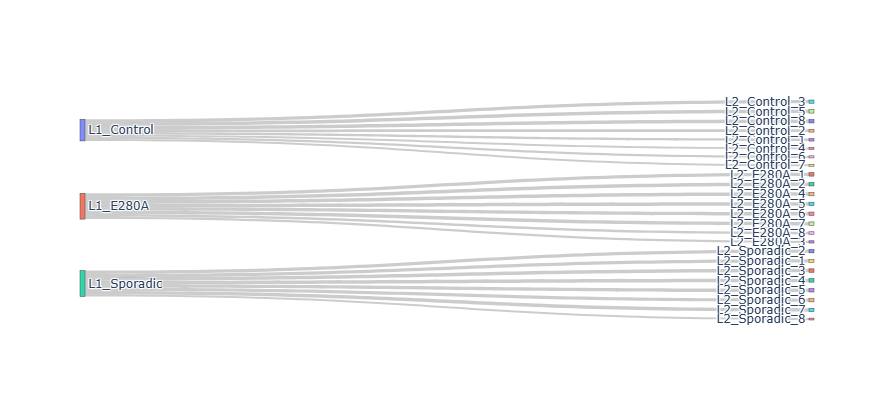

In [10]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 400), th=30, title_y=0.85 )

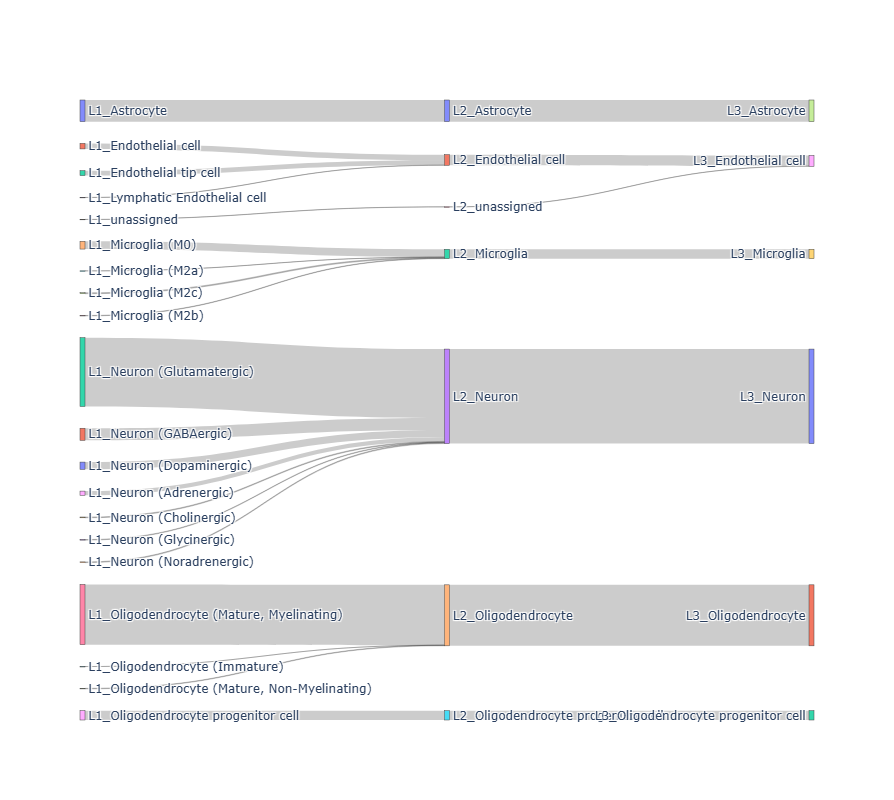

In [11]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=10, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

In [ ]:
adata_t.uns['analysis_parameters']

## __4. Explore your data__
A. <font color=blue>세포유형 식별결과 확인</font>
   - 시각화를 위한 기본 처리 및 UMAP 좌표 생성
   - 세포유형 마커 발현 패턴 확인
   - 세포유형 population 확인 및 조건특이적 특징 판별

B. <font color=blue>CNV 및 암세포 식별 결과 확인</font>
   - CNV heatmap 확인
   - UMAP을 통한 암세포 식별 결과 확인

C. <font color=blue>세포유형간 ligand-receptor 상호작용 프로파일</font>
   - 결과 데이터의 구성
   - dot plot 및 circle plot을 이용한 확인
   - 조건-특이적 상호작용의 통계적 검정 및 boxplot을 이용한 확인   

D. <font color=blue>DEG 분석 결과 및 마커/표적 탐색</font>
   - DEG 결과 데이터의 구성
   - DEG 결과의 확인
   - 마커/표적 탐색 및 dotplot을 이용한 확인

E. <font color=blue>유전자 집합 분석(Gene Set Analysis) 결과 확인</font>
  - GSA/GSEA 결과 데이터의 구성
  - barplot을 이용한 GSA/GSEA 결과의 확인
  - dotplot을 이용한 GSA/GSEA 결과의 확인

F. <font color=firebrick>암유전체 빅데이터의 보조적 활용</font>

G. <font color=firebrick>KEGG pathview 생성하여 pathway상의 변화 확인</font> (별도의 주피터 노트북 제공)

### __A. Review of cell type annotation results__

- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/
- __HiCAT:__ https://github.com/combio-dku/HiCAT

In [5]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

rename_dict['celltype_minor']['Oligodendrocyte'] = 'OD'
rename_dict['celltype_minor']['Oligodendrocyte progenitor cell'] = 'ODp'


#### __A.1 Basic preprocessing for UMAP projection__
- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/

In [6]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:].copy()
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

#### __A.2 An overview of celltype annotation result__
- __HiCAT:__ https://github.com/combio-dku/HiCAT

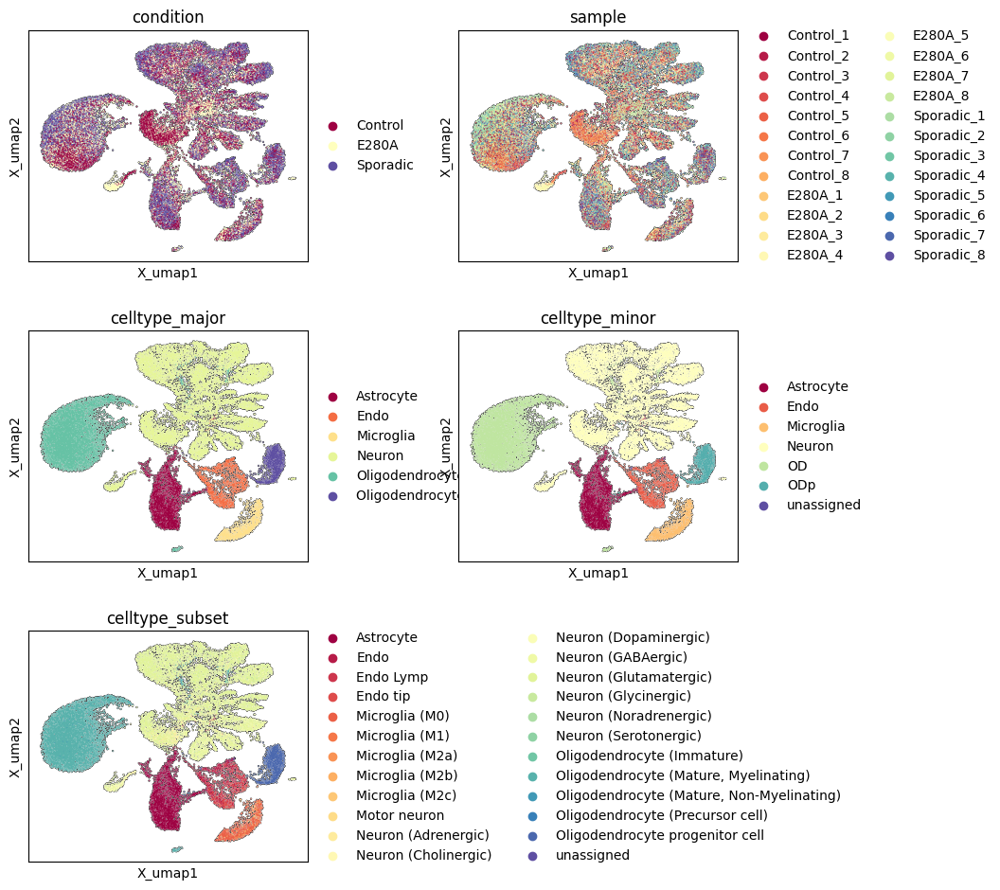

In [7]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

## Abbreviate cell names
cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

#### __A.3 Inspecting minor-type annotation result__

In [18]:
adata.obs['celltype_minor'].value_counts()

celltype_minor
Neuron                             15423
Oligodendrocyte                     9954
Astrocyte                           3531
Endo                                1740
Microglia                           1536
Oligodendrocyte progenitor cell     1527
unassigned                            34
Name: count, dtype: int64

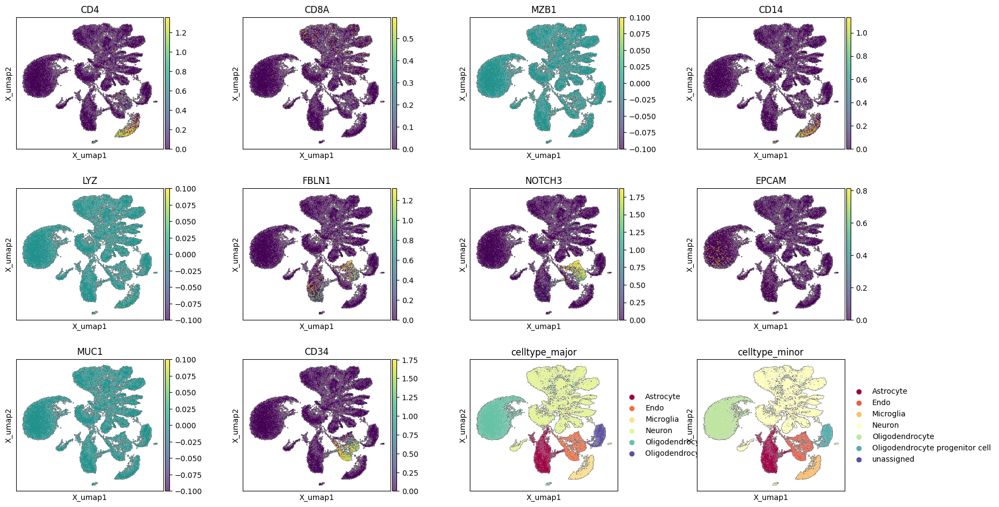

In [19]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = [g for g in genes if g in genes_all] + items_to_plot

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3,
                 legend_fontsize = 10,ncols = 4, palette = 'Spectral',
                 add_outline = True, vmax = 'p99', vmin = 0)

#### __A.4 Subset marker expression profile__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 103 -> 103


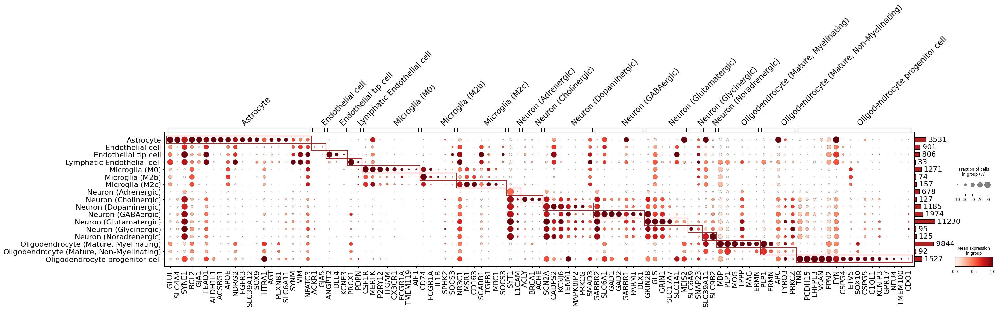

In [77]:
mkr_dct_selected = plot_marker_exp(  adata_t, markers = None,
                  N_cells_per_group_min = 30, N_markers_per_group_max = 20, N_markers_total = 120,
                  title = None, title_y_pos = 1.1, title_fs = 30,
                  text_fs = 16, standard_scale = 'var',
                  var_group_rotation = 45, var_group_height = 1.2,
                  nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3,
                  figsize = None, swap_ax = False, legend = True,
                  cmap = 'Reds', linewidth = 1.5, linecolor = 'firebrick')

#### __Practice:__ Visualizing microglia subsets

In [8]:
b = adata_t.obs['celltype_major'] == 'Microglia'
adata = adata_t[b,:].copy()

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

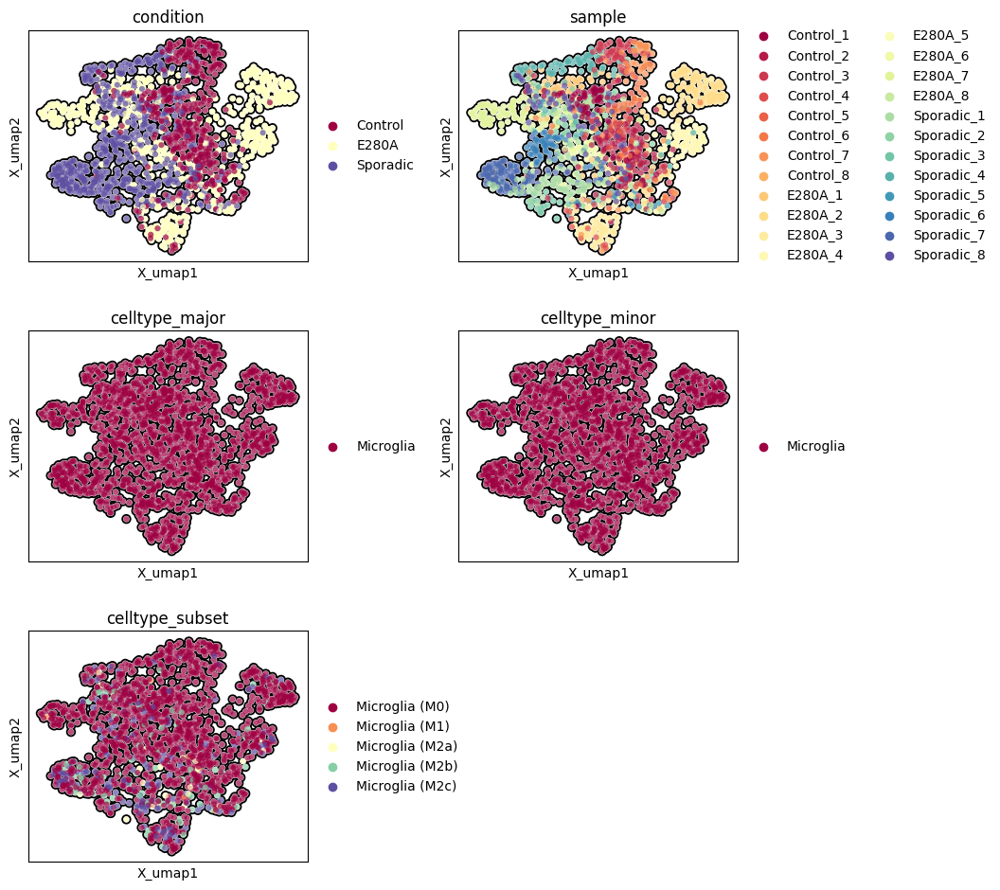

In [9]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

#### __A.5 Inspecting celltype population__


,Group,Astrocyte,Endothelial cell,Microglia,Neuron,Oligodendrocyte,Oligodendrocyte progenitor cell,unassigned
Control_1,Control,9.2,4.8,7.6,25.1,47.6,5.5,0.2
Control_2,Control,11.4,7.5,8.4,59.9,8.2,4.5,0.1
Control_3,Control,12.7,7.8,5.0,50.1,19.2,5.2,0.0
Control_4,Control,10.3,4.4,4.8,50.2,24.0,6.3,0.1
Control_5,Control,1.4,1.0,0.1,94.9,2.4,0.2,0.0
Control_6,Control,8.0,4.9,4.3,43.3,35.7,3.8,0.0
Control_7,Control,7.9,4.9,5.9,48.3,30.9,2.0,0.1
Control_8,Control,7.7,2.2,0.2,76.8,11.3,1.8,0.0
E280A_1,E280A,14.9,7.1,5.1,32.5,34.1,6.3,0.1
E280A_2,E280A,9.4,1.5,8.4,22.6,54.8,3.3,0.0


<Figure size 350x350 with 0 Axes>

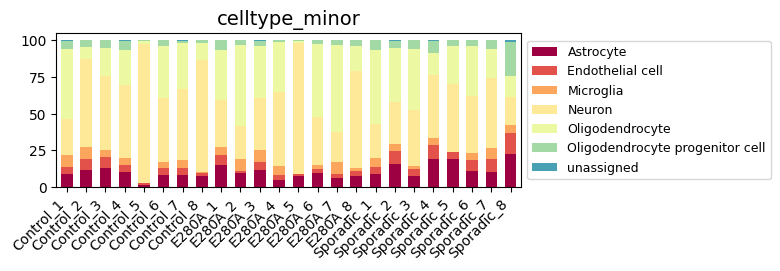

In [10]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [] )

## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct.drop(columns = 'Group'), bar_width = 0.6,
                 title = celltype_col, title_fs = 14,
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'center left', bbox_to_anchor = (1,0.5),
                 legend_ncol = 1, cmap = None, figsize=(6, 2), dpi = 100)

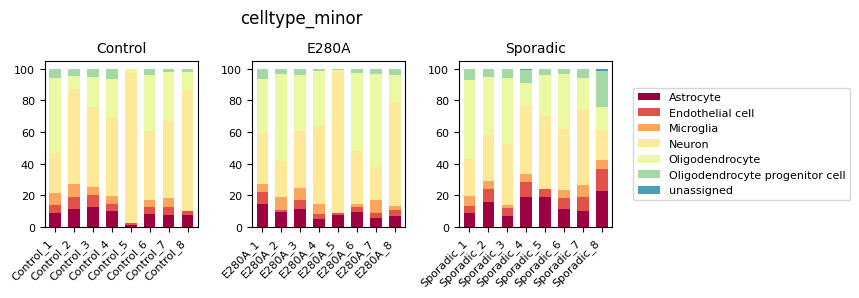

In [11]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

plot_population_grouped( df_pct, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'center left', bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1, cmap = None, figsize=(7, 2), dpi = 100,
                         wspace = 0.35, hspace = 0.2 )

#### __A.6 Inspecting condition-specificity in celltype population__

In [12]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

,E280A_vs_Control,Sporadic_vs_Control,Sporadic_vs_E280A
Endothelial cell,0.307478,0.056196,0.011079
Neuron,0.292121,0.036387,0.396599
Oligodendrocyte progenitor cell,0.541024,0.113045,0.072958
Oligodendrocyte,0.151915,0.323528,0.485604
Astrocyte,0.855033,0.031805,0.038822
unassigned,0.926827,0.243172,0.238694
Microglia,0.747341,0.993885,0.708305


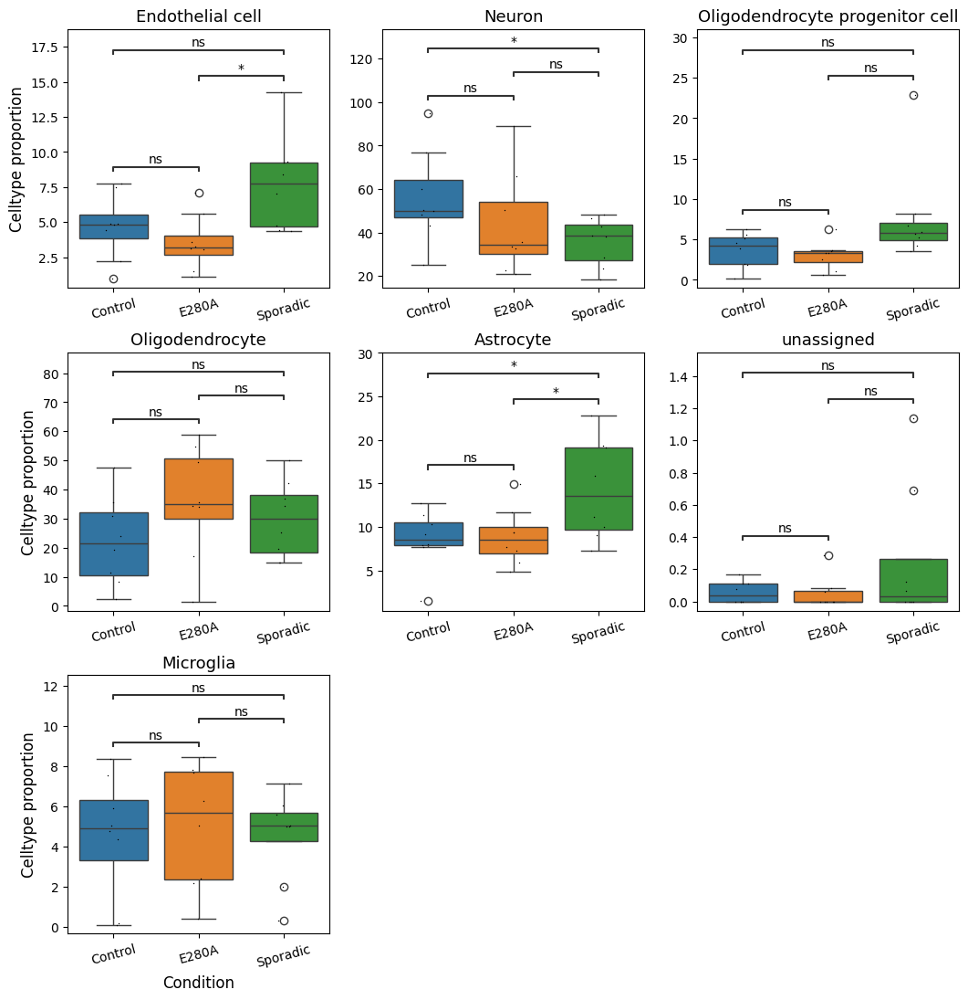

In [13]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], df_pct['Group'], ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, stripplot_ms = 5, cmap = 'tab10')

#### __Practice: Inspecting subset population__

,Group,Microglia (M0),Microglia (M1),Microglia (M2a),Microglia (M2b),Microglia (M2c)
Control_1,Control,79,0,2,3,6
Control_2,Control,98,2,2,1,4
Control_3,Control,70,0,0,2,3
Control_4,Control,38,0,1,1,4
Control_5,Control,1,0,0,0,0
Control_6,Control,40,0,0,1,1
Control_7,Control,50,0,1,0,2
Control_8,Control,2,0,0,0,1
E280A_1,E280A,71,1,2,0,7
E280A_2,E280A,125,0,0,4,6


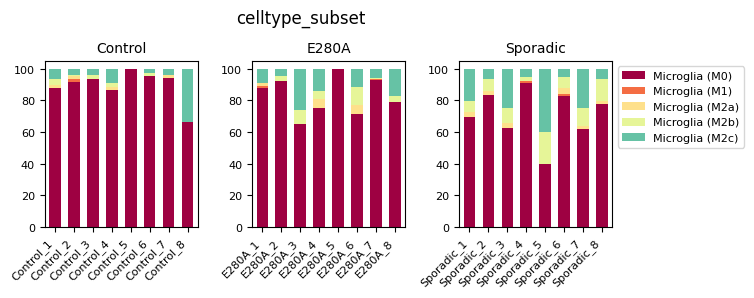

In [14]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Microglia'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct, sort_by = [],
                         title = col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, bar_width = 0.6,
                         tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left',
                         bbox_to_anchor = (1,1), legend_ncol = 1,
                         cmap = None, figsize=(7, 2), wspace = 0.35, dpi = 100)

In [15]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

,E280A_vs_Control,Sporadic_vs_Control,Sporadic_vs_E280A
Microglia (M2b),0.130966,0.002584,0.029615
Microglia (M0),0.269715,0.020428,0.126183
Microglia (M2c),0.529414,0.168568,0.327597
Microglia (M2a),0.484939,0.131326,0.791987


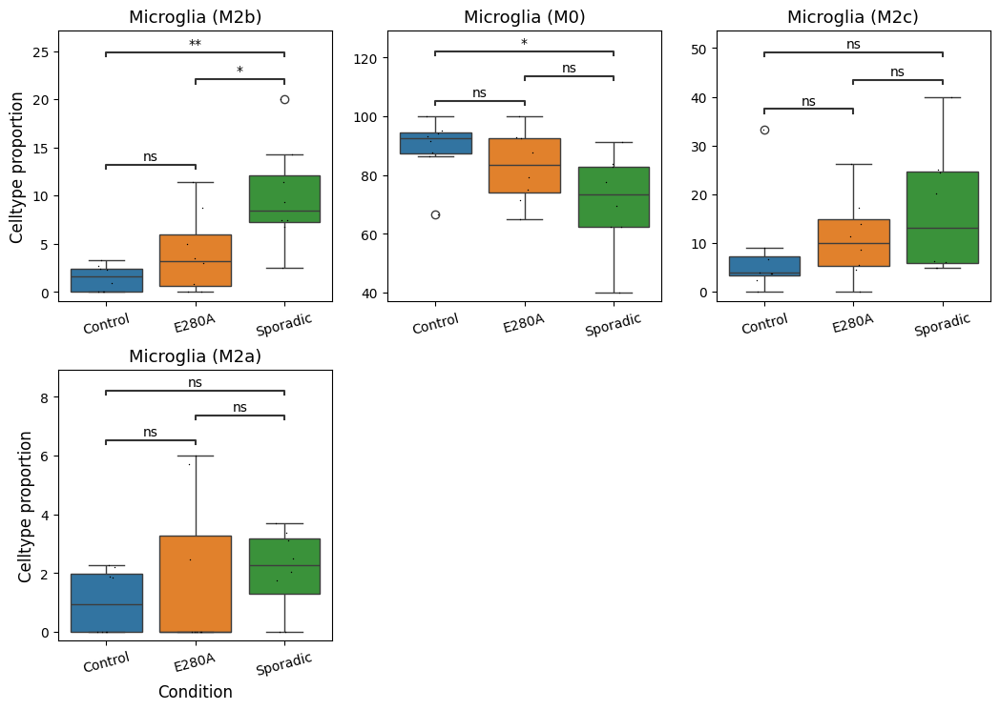

In [16]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], df_pct['Group'], ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, stripplot_ms = 5, cmap = 'tab10')

### __B. CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNV:__ https://github.com/broadinstitute/infercnv
- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__ https://github.com/combio-dku/InferPloidy

#### __B.1 Inspecting CNV estimates using heatmap__
- We first group the cells into appropriate groups
- then compare the CNV patterns of the resulting cell groups using a heatmap.

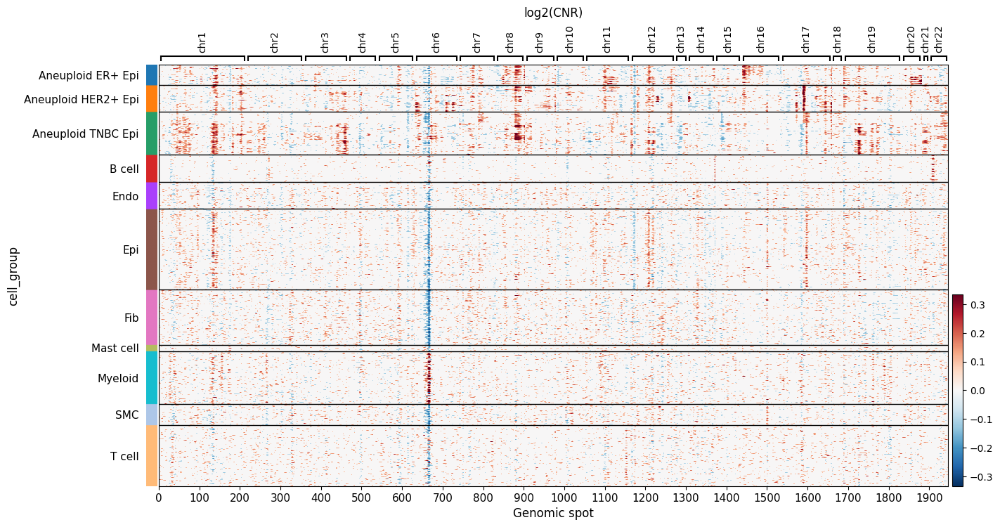

In [19]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:].copy()

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].astype(str).copy(deep = True)
adata.obs['cell_group'] = adata.obs['cell_group'].replace(rename_dict['celltype_major'])

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
b = adata.obs['ploidy_dec'] == 'Aneuploid'
adata.obs.loc[b, 'cell_group'] = 'Aneuploid ' + adata.obs.loc[b, 'condition'].astype(str) \
                               + ' ' + adata.obs.loc[b, 'cell_group']

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group', N_cells_min = 200,
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

#### __B.2 Comparison of CNV patterns across samples using only cells identified as tumor cells__

In [20]:
adata

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'cell_group'
    var: 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X

INFO: n_samples_min: 4 -> 2 


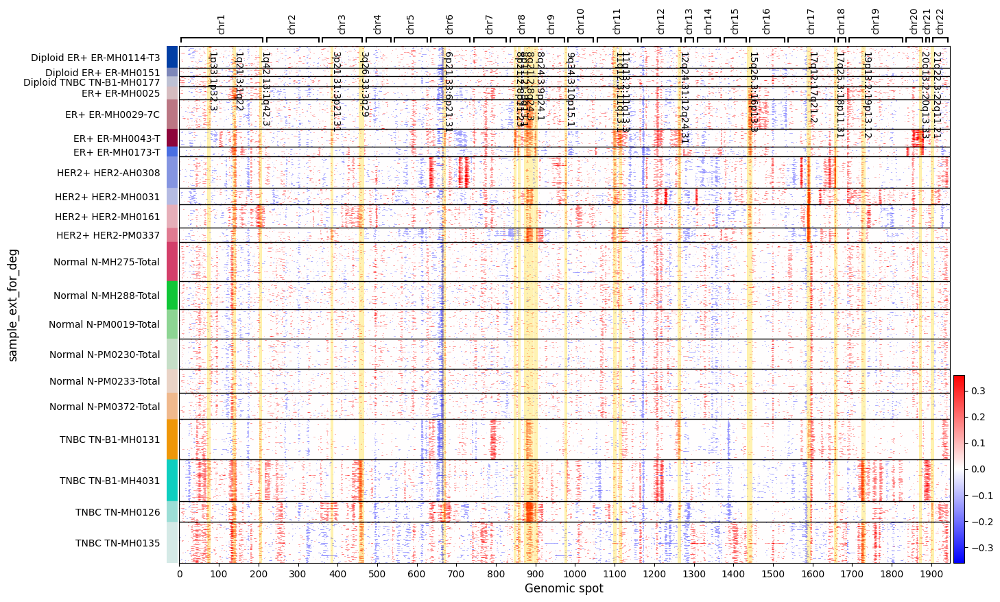

In [21]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd, cna_res = plot_cnv( adata_s, groupby = cell_grouping, N_cells_min = 200,
                title = None, title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 10, Ns_min = 4, show_cna_spots = True,
                figsize = (15, 10), swap_axes = False,
                var_group_rotation = 90, cmap='bwr', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

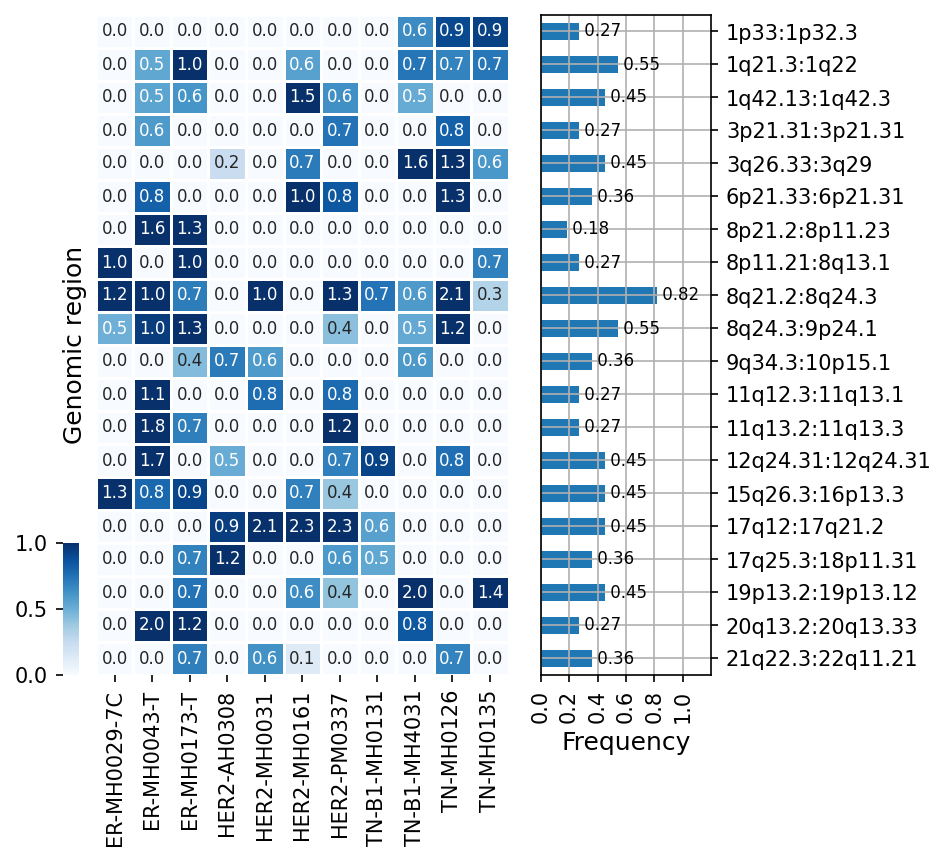

In [22]:
axes = plot_cnv_hit( cna_res['cnv_peaks_pos'], title = None, title_fs = 13,
                     label_fs = 12, tick_fs = 10, wspace = 0.1,
                     dpi = 150, ylabel = 'Genomic region',
                     bin_size = 0.22, cmap = 'Blues')

# cna_res['genes']

#### __B.3 Finding genomic spots where CNV has a peak__

In [23]:
## Select cells of interest
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = 'condition', width = 5, std_scale = 5, q = None )
cnv_peaks

{'ER+': {140: array(['AC234582.1', 'THBS3', 'MTX1', 'GBA', 'FAM189B', 'SCAMP3', 'CLK2',
         'HCN3', 'PKLR', 'FDPS', 'RUSC1-AS1', 'RUSC1', 'ASH1L', 'ASH1L-AS1',
         'AL353807.2', 'MSTO1', 'YY1AP1', 'DAP3', 'GON4L', 'SYT11', 'RIT1',
         'KHDC4', 'ARHGEF2', 'AL355388.2', 'SSR2', 'UBQLN4', 'LAMTOR2',
         'RAB25', 'MEX3A', 'LMNA', 'SEMA4A'], dtype=object),
  902: array(['KIFC2', 'FOXH1', 'PPP1R16A', 'GPT', 'MFSD3', 'RECQL4', 'LRRC14',
         'LRRC24', 'C8orf82', 'ARHGAP39', 'AF186192.1', 'AF186192.3',
         'ZNF251', 'ZNF34', 'RPL8', 'ZNF517', 'ZNF7', 'COMMD5', 'ZNF250',
         'ZNF16', 'ZNF252P-AS1', 'C8orf33', 'WASHC1', 'AL928970.1',
         'PGM5P3-AS1', 'FOXD4', 'CBWD1', 'C9orf66', 'DOCK8', 'KANK1',
         'AL136979.1', 'DMRT1', 'DMRT3', 'LINC01230'], dtype=object),
  1208: array(['AC021066.1', 'KRT81', 'AC121757.1', 'KRT83', 'KRT75', 'KRT6B',
         'KRT6C', 'KRT6A', 'KRT5', 'KRT72', 'KRT2', 'KRT1', 'KRT77', 'KRT4',
         'KRT79', 'KRT78', 'KRT8', 'KR

#### __B.4 Visualizing CNV patterns using UMAP projection__

In [24]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

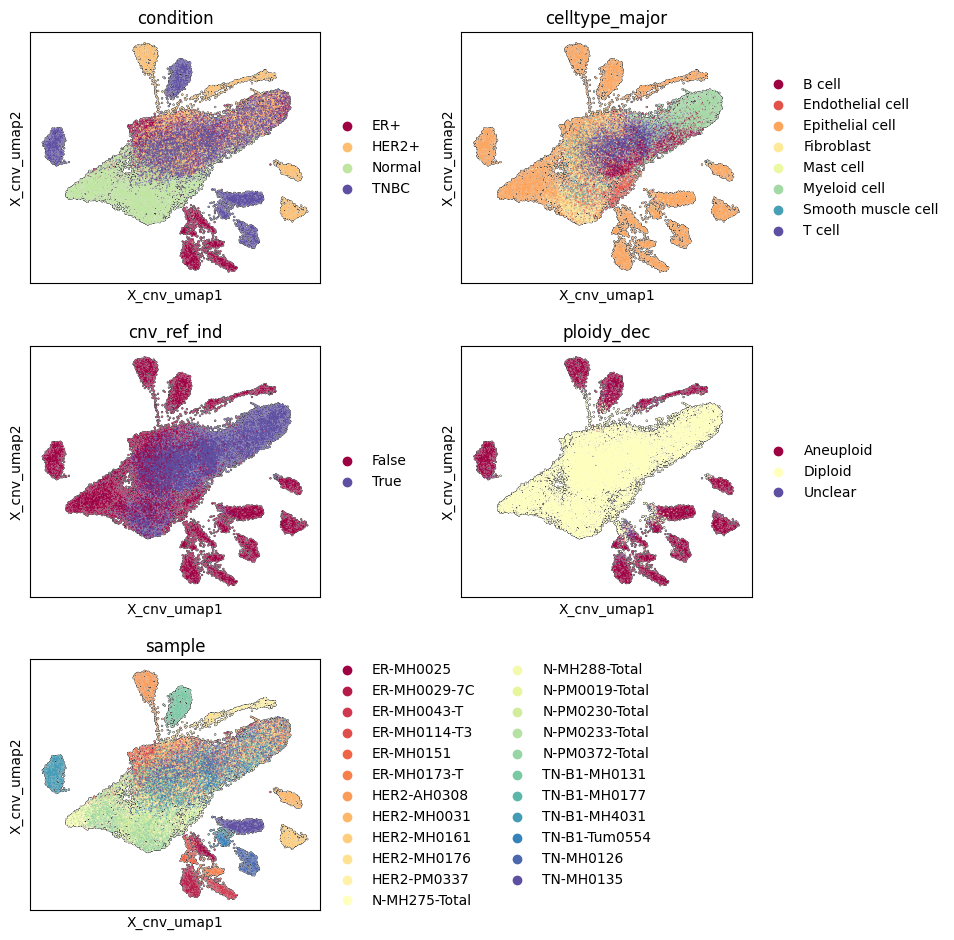

In [25]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)

#### __B.5  Inspecting aneuploid/diploid cell population__

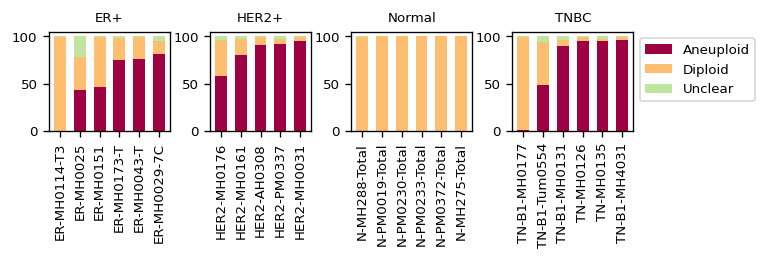

In [26]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

col = 'ploidy_dec'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )

plot_population_grouped( df_pct, sort_by = ['Aneuploid'], bar_width = 0.6,
                 title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
                 label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
                 legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap = None, figsize=(6, 1), wspace = 0.35)

### __C. Cell-cell interaction analysis results__
- __CellPhoneDB:__ https://www.cellphonedb.org/

#### __C.1 Structure and format of the cell–cell interaction results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

- The CCI results are stored separately for each sample and each condition.
- The data format is consistent between the two result types.
- For condition-level CCI, only interactions that are commonly observed in a certain percentage of samples within the condition are retained.

In [17]:
## 샘플 별 CCI 결과
cci_df_dct = adata_t.uns['CCI_sample']
sample_lst = list(cci_df_dct.keys())
sample_lst

['Control_1',
 'Control_2',
 'Control_3',
 'Control_4',
 'Control_6',
 'Control_7',
 'Control_8',
 'E280A_1',
 'E280A_2',
 'E280A_3',
 'E280A_4',
 'E280A_5',
 'E280A_6',
 'E280A_7',
 'E280A_8',
 'Sporadic_1',
 'Sporadic_2',
 'Sporadic_3',
 'Sporadic_4',
 'Sporadic_5',
 'Sporadic_6',
 'Sporadic_7',
 'Sporadic_8']

In [18]:
## CCI results in a data frame
cci_df_dct[sample_lst[-1]]

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
EGF_EGFR--Astrocyte|Astrocyte,EGF_EGFR,Astrocyte|Astrocyte,EGF,EGFR,Astrocyte,Astrocyte,0.03,0.730
atRetinoicAcid_byALDH1A1_RORB--Astrocyte|Astrocyte,atRetinoicAcid_byALDH1A1_RORB,Astrocyte|Astrocyte,atRetinoicAcid,byALDH1A1_RORB,Astrocyte,Astrocyte,0.00,0.638
BMP7_BMPR1B_BMPR2--Astrocyte|Astrocyte,BMP7_BMPR1B_BMPR2,Astrocyte|Astrocyte,BMP7,BMPR1B_BMPR2,Astrocyte,Astrocyte,0.06,0.605
BMPR1B_BMPR2_BMPR1A--Astrocyte|Astrocyte,BMPR1B_BMPR2_BMPR1A,Astrocyte|Astrocyte,BMPR1B,BMPR2_BMPR1A,Astrocyte,Astrocyte,0.00,0.985
NRG2_ERBB4--Astrocyte|Astrocyte,NRG2_ERBB4,Astrocyte|Astrocyte,NRG2,ERBB4,Astrocyte,Astrocyte,0.00,6.555
...,...,...,...,...,...,...,...,...
Glutamate_byGLS_and_SLC1A3_Glutamate_Kainate_2_4_complex--Oligodendrocyte progenitor cell|Oligodendrocyte progenitor cell,Glutamate_byGLS_and_SLC1A3_Glutamate_Kainate_2...,Oligodendrocyte progenitor cell|Oligodendrocyt...,Glutamate,byGLS_and_SLC1A3_Glutamate_Kainate_2_4_complex,Oligodendrocyte progenitor cell,Oligodendrocyte progenitor cell,0.00,1.127
Glutamate_byGLS_and_SLC1A1_Glutamate_Kainate_3_4_complex--Oligodendrocyte progenitor cell|Oligodendrocyte progenitor cell,Glutamate_byGLS_and_SLC1A1_Glutamate_Kainate_3...,Oligodendrocyte progenitor cell|Oligodendrocyt...,Glutamate,byGLS_and_SLC1A1_Glutamate_Kainate_3_4_complex,Oligodendrocyte progenitor cell,Oligodendrocyte progenitor cell,0.00,0.896
Glutamate_byGLS_and_SLC1A2_Glutamate_Kainate_3_4_complex--Oligodendrocyte progenitor cell|Oligodendrocyte progenitor cell,Glutamate_byGLS_and_SLC1A2_Glutamate_Kainate_3...,Oligodendrocyte progenitor cell|Oligodendrocyt...,Glutamate,byGLS_and_SLC1A2_Glutamate_Kainate_3_4_complex,Oligodendrocyte progenitor cell,Oligodendrocyte progenitor cell,0.00,0.896
Glutamate_byGLS_and_SLC1A3_Glutamate_Kainate_3_4_complex--Oligodendrocyte progenitor cell|Oligodendrocyte progenitor cell,Glutamate_byGLS_and_SLC1A3_Glutamate_Kainate_3...,Oligodendrocyte progenitor cell|Oligodendrocyt...,Glutamate,byGLS_and_SLC1A3_Glutamate_Kainate_3_4_complex,Oligodendrocyte progenitor cell,Oligodendrocyte progenitor cell,0.00,0.896


In [19]:
## Condition 별 CCI 결과
cci_df_dct_per_cond = adata_t.uns['CCI']
cond_lst = list(cci_df_dct_per_cond.keys())
cond_lst

['Control', 'E280A', 'Sporadic']

#### __C.2 Inspecting condition-specific CCIs__

In [20]:
cci_df_dct_per_cond = adata_t.uns['CCI']

In [21]:
adata_t.obs['celltype_for_cci'].value_counts()

celltype_for_cci
Neuron                             15423
Oligodendrocyte                     9954
Astrocyte                           3531
Endothelial cell                    1740
Microglia                           1536
Oligodendrocyte progenitor cell     1527
unassigned                            34
Name: count, dtype: int64

15 cell_pairs, 101 gene_pairs found


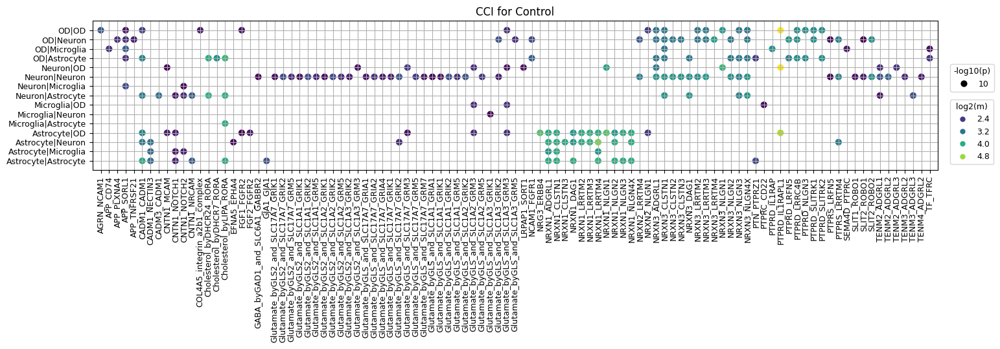

11 cell_pairs, 101 gene_pairs found


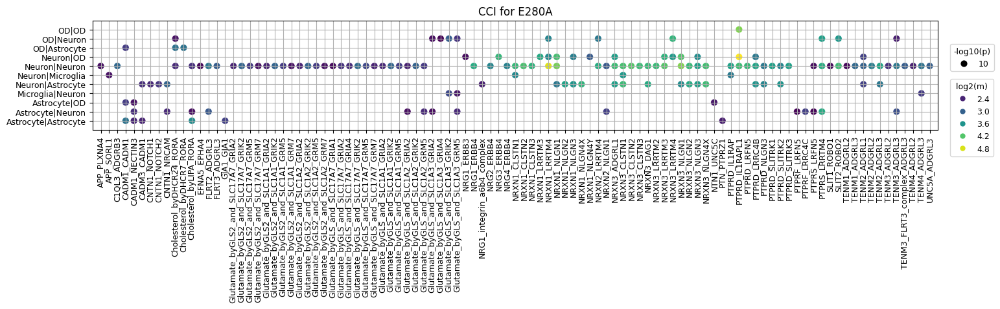

11 cell_pairs, 101 gene_pairs found


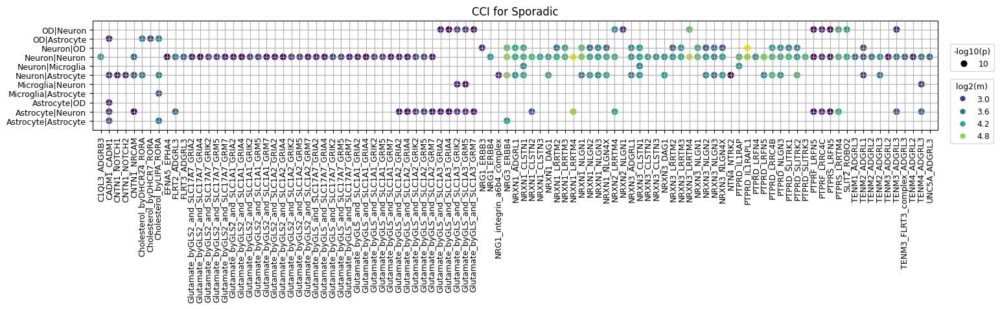

In [22]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Microglia', 'Astrocyte', 'Oligodendrocyte', 'Neuron']
target_genes = []

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 100,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

#### __C.3 Exploring CCis associated with a specific gene set__  

In [23]:
b1 = adata_t.var_names.str.startswith('CCL')
b2 = adata_t.var_names.str.startswith('CXCL')
b3 = adata_t.var_names.str.startswith('IL')

genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['IL22RA1', 'IL23R', 'IL12RB2', 'ILF2', 'IL6R-AS1', 'IL6R', 'ILDR2',
       'IL10', 'IL19', 'IL1R2', 'IL1R1', 'IL1RL2', 'IL18R1', 'IL18RAP',
       'IL1A', 'IL1B', 'IL1RN', 'CCL20', 'ILKAP', 'IL5RA', 'IL17RE',
       'IL17RC', 'IL17RB', 'IL17RD', 'ILDR1', 'IL20RB', 'IL20RB-AS1',
       'IL12A-AS1', 'IL12A', 'IL1RAP', 'CXCL8', 'CXCL6', 'CXCL1', 'CXCL5',
       'CXCL3', 'CXCL2', 'CXCL11', 'CXCL13', 'IL21-AS1', 'IL15', 'IL7R',
       'CCL28', 'IL31RA', 'IL6ST', 'IL5', 'IL13', 'CXCL14', 'IL17B',
       'IL17F', 'IL20RA', 'IL6', 'CCL26', 'IL3RA', 'IL1RAPL1', 'IL1RAPL2',
       'IL13RA2', 'IL13RA1', 'IL9R', 'IL7', 'IL33', 'IL11RA', 'CCL27',
       'ILK', 'IL18BP', 'IL18', 'IL10RA', 'IL15RA', 'IL2RA', 'CXCL12',
       'IL23A', 'IL26', 'IL17D', 'IL16', 'IL32', 'IL4R', 'IL21R',
       'IL21R-AS1', 'IL27', 'CCL17', 'IL34', 'CXCL16', 'CCL2', 'CCL5',
       'CCL3', 'CCL4', 'CCL3L1', 'CCL4L2', 'CCL25', 'ILF3-DT', 'ILF3',
       'IL27RA', 'ILVBL', 'IL12RB1', 'CXCL17', 'IL4I1', 'IL11', 'IL17RA'

6 cell_pairs, 3 gene_pairs found


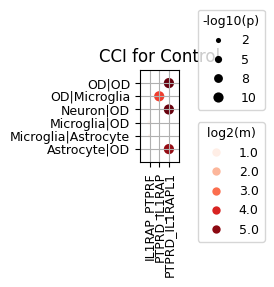

7 cell_pairs, 4 gene_pairs found


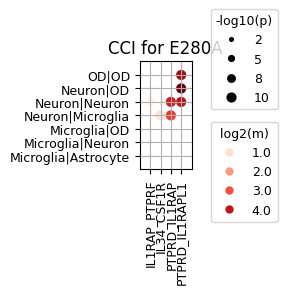

6 cell_pairs, 4 gene_pairs found


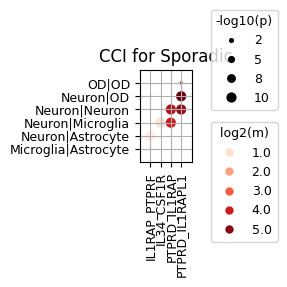

In [24]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Microglia', 'Astrocyte', 'Oligodendrocyte', 'Neuron']

## CellPhoneDB는 인간 유전자 이름만 사용하므로 마우스의 경우 유전자 이름을 대문자로 변경 필요.
target_genes = [g.upper() for g in genes_sel] + ['NAMPT']

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = 'Reds')

#### __C.4 Inspecting per-sample CCIs__

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Microglia', 'Astrocyte', 'Oligodendrocyte', 'Neuron']
target_genes = []

ax = plot_cci_dot( cci_df_dct, n_gene_pairs = 100,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

#### __C.5 Statistical test for condition-specific differences in CCI strength__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [26]:
target_cells = ['Microglia', 'Astrocyte', 'Oligodendrocyte', 'Neuron']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.1 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, ref_group = None, pval_cutoff = 0.05 )
df_res

,E280A_vs_Control,Sporadic_vs_Control,Sporadic_vs_E280A
COL19A1_integrin_a10b1_complex--Neuron|Endothelial cell,0.018193,0.000303,0.032385
COL9A2_integrin_a2b1_complex--Oligodendrocyte|Oligodendrocyte,0.005323,0.001683,0.041957
PTPRS_SLITRK4--Oligodendrocyte|Neuron,0.041089,0.000410,0.025291
PTPRD_IL1RAPL1--Oligodendrocyte|Oligodendrocyte,0.008992,0.002020,0.024329
CADM1_NECTIN3--Astrocyte|Endothelial cell,0.017879,0.002912,0.016948
...,...,...,...
NRXN3_LRRTM4--Neuron|Astrocyte,1.000000,1.000000,0.048231
EFNB2_EPHB2--Endothelial cell|Microglia,1.000000,0.048647,1.000000
PTPRD_LRRC4B--Oligodendrocyte|Oligodendrocyte progenitor cell,0.049797,1.000000,1.000000
integrin_aVb1_complex_ADGRE5--Endothelial cell|Oligodendrocyte,0.049803,1.000000,1.000000


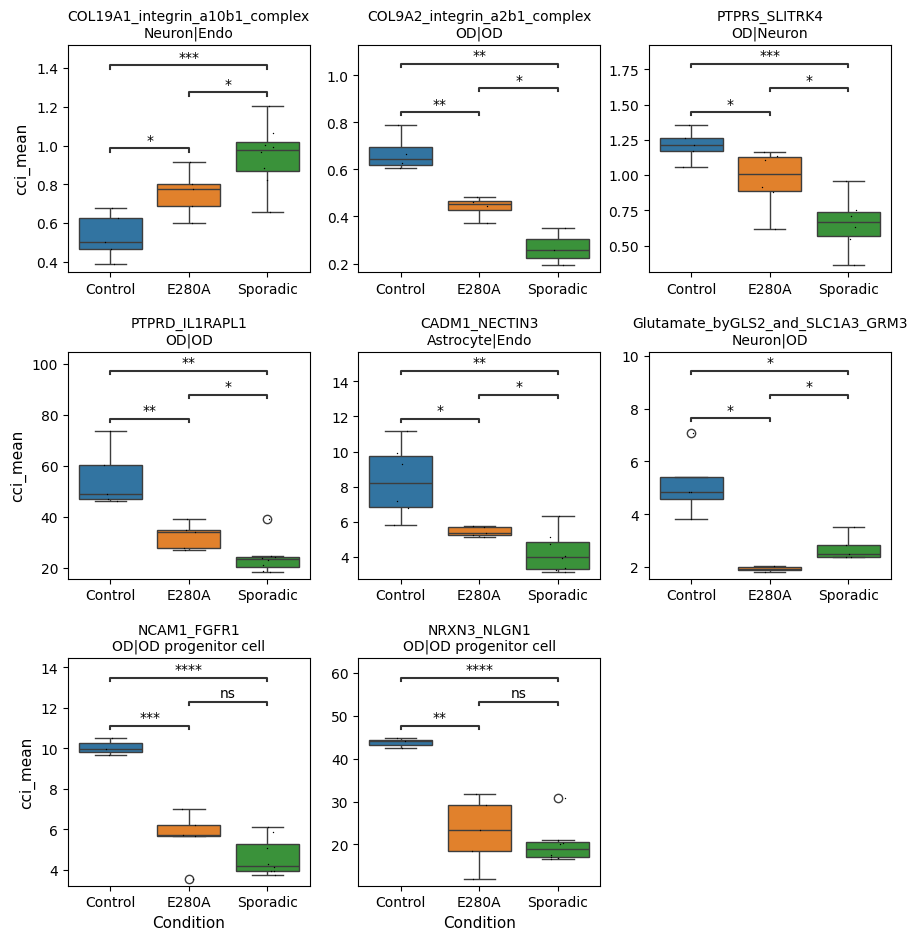

In [27]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    plot_pct_box(df[idx_sel], df['Group'], ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'star', annot_fs = 10,
              ws_hs = (0.2, 0.35), stripplot = True, stripplot_ms = 5)

#### __C.6 Statistical test for condition-specific differences in CCI strength (specifying genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [28]:
target_cells = ['Microglia', 'Astrocyte', 'Oligodendrocyte', 'Neuron']
target_genes = ['CADM1', 'NECTIN3']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.2 )

## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, ref_group = None, pval_cutoff = 0.5 )
df_res

,E280A_vs_Control,Sporadic_vs_Control,Sporadic_vs_E280A
CADM1_CADM1--Oligodendrocyte|Astrocyte,0.001769,0.000481,0.218454
CADM1_CADM1--Astrocyte|Oligodendrocyte,0.001769,0.000481,0.218454
CADM1_NECTIN3--Astrocyte|Endothelial cell,0.017879,0.002912,0.016948
CADM1_NECTIN3--Astrocyte|Astrocyte,0.008248,0.002813,0.184477
CADM1_NECTIN3--Astrocyte|Oligodendrocyte progenitor cell,0.019353,0.014389,0.415386
...,...,...,...
CADM1_NECTIN3--Neuron|Oligodendrocyte,1.000000,1.000000,0.409080
CADM1_NECTIN3--Neuron|Endothelial cell,1.000000,1.000000,0.414767
CADM3_CADM1--Oligodendrocyte progenitor cell|Neuron,1.000000,1.000000,0.433156
CADM1_NECTIN3--Oligodendrocyte progenitor cell|Astrocyte,0.468570,1.000000,1.000000


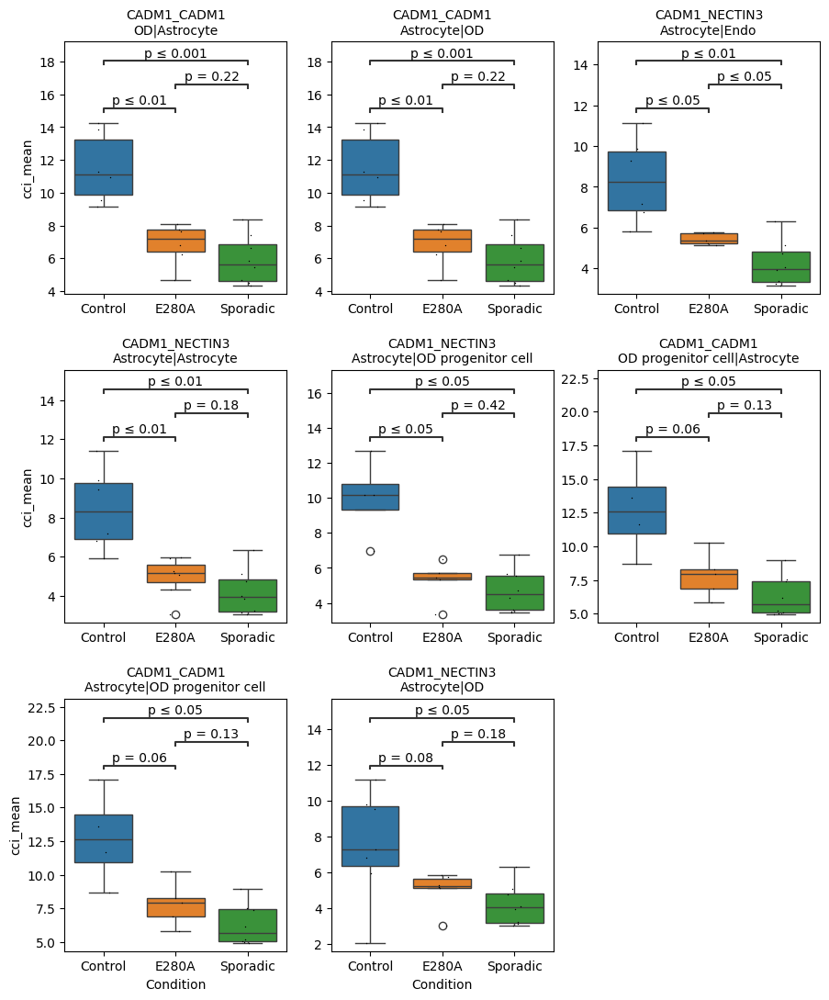

In [29]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the selected CCIs
    plot_pct_box(df[idx_sel], df['Group'], ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3.5), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 10, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.3), stripplot = True, stripplot_ms = 5)

#### __C.7 Circle plots for an overview of cell-cell interactions__

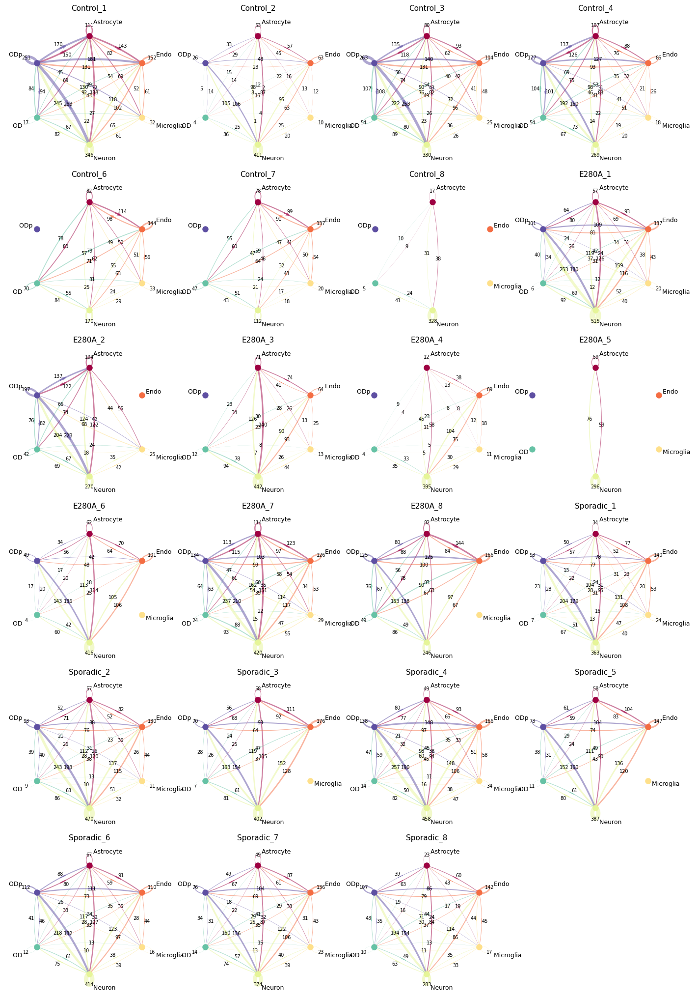

In [65]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI_sample'], target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

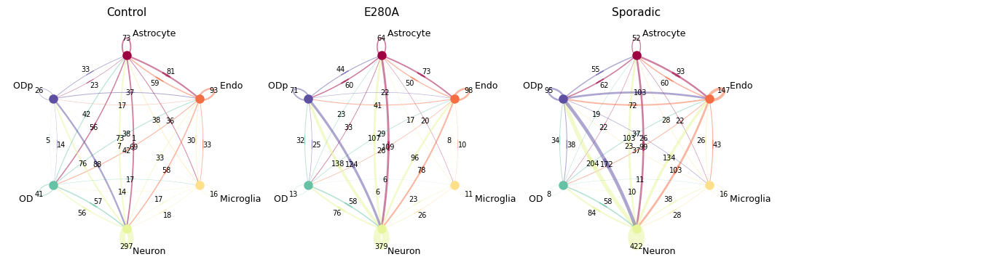

In [67]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI'], target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.25, hspace = 0.1 )

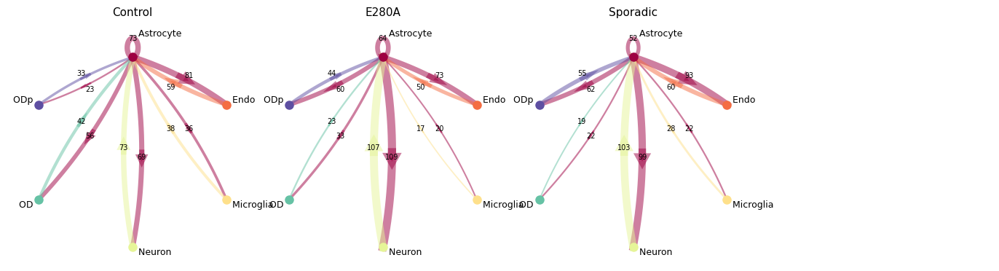

In [47]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Astrocyte']

plot_cci_circ_group( adata_t.uns['CCI'], target = target,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

### __D. DEG analysis results and marker/target discovery__

In [43]:
adata_t

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind'
    var: 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_

In [30]:
nc_deg_dct_of_dct = adata_t.uns['DEG_vs_ref_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct_of_dct = adata_t.uns['DEG_vs_ref'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct_of_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['Astrocyte',
 'Endothelial cell',
 'Microglia',
 'Neuron',
 'Oligodendrocyte',
 'Oligodendrocyte progenitor cell']

#### __D.1 Structure and format of the DEG results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

- The DEG results are processed and stored separately for each cell type.
- The cell type level to be used—major, minor, or subset—can be specified in the analysis_parameters when running SCODA.
- The current results are based on the celltype_minor level and reflect condition-specific DEGs identified for each cell type.

In [48]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Astrocyte'

df_deg_dct = df_deg_dct_of_dct[target_cell]
nc_deg_dct = nc_deg_dct_of_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg_dct

{'Control_vs_others': {'Control': 833, 'others': 2391},
 'E280A_vs_Control': {'Control': 833, 'E280A': 1004},
 'Sporadic_vs_Control': {'Control': 833, 'Sporadic': 1387}}

In [49]:
df_deg_dct['Sporadic_vs_Control'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,nz_pct_pval,gene,Rp
AL627171.2,3.493,2.445855e-94,2.579643e-90,1.117720,0.167899,0.459265,0.111645,0.362440,6.252862e-64,AL627171.2,0.875
CD44,2.146,1.123331e-40,1.184777e-36,1.188582,0.415906,0.428262,0.181273,0.287071,7.984319e-33,CD44,1.000
AC104574.2,2.472,9.735463e-44,1.026799e-39,0.895445,0.232024,0.329488,0.121248,0.254432,6.545947e-28,AC104574.2,1.000
PLCE1,1.437,1.761474e-26,1.857827e-22,1.074166,0.537618,0.475847,0.273709,0.251008,4.823915e-21,PLCE1,1.000
RIMS1,1.813,4.446303e-32,4.689515e-28,1.056926,0.428042,0.396539,0.220888,0.240705,1.625351e-17,RIMS1,1.000


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

#### __D.2 Gene ranking per celltype__

Astrocyte


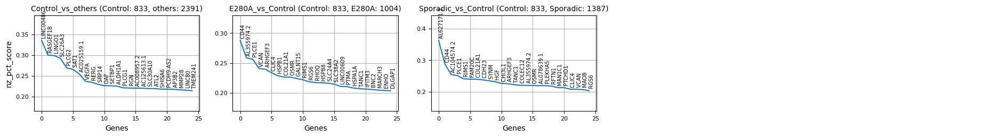

In [50]:
key = 'Astrocyte'
df_deg_dct = df_deg_dct_of_dct[key]
nc_deg_dct = nc_deg_dct_of_dct[key]

n_genes_to_show = 25

print(key)
plot_deg( df_deg_dct, reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
          figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
          tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
          deg_stat_dct = nc_deg_dct, show_log_pv = False )


Astrocyte


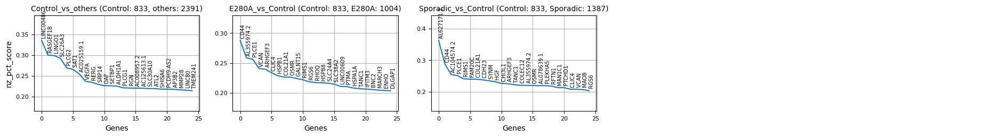

Endothelial cell


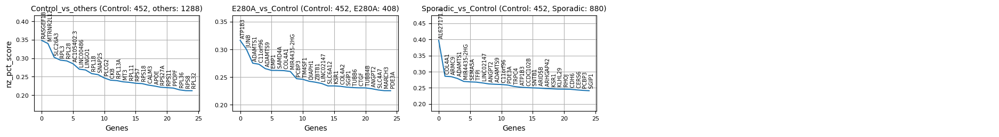

Microglia


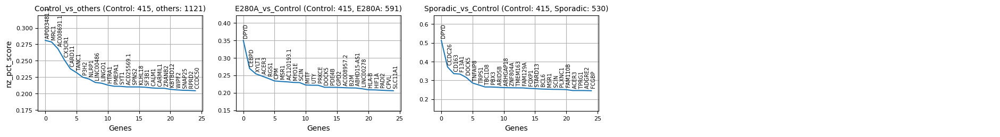

Neuron


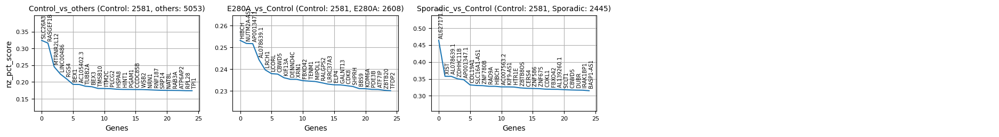

Oligodendrocyte


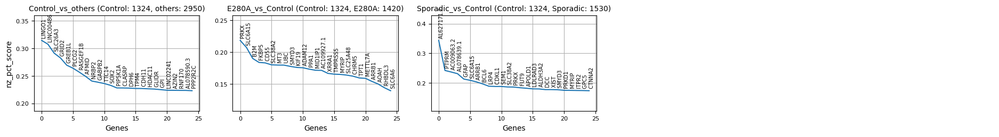

Oligodendrocyte progenitor cell


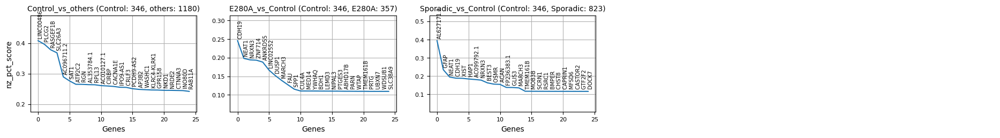

In [51]:
n_genes_to_show = 25

for key in df_deg_dct_of_dct.keys():
    df_deg_dct = df_deg_dct_of_dct[key]
    nc_deg_dct = nc_deg_dct_of_dct[key]

    print(key)
    plot_deg( df_deg_dct, reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
              figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
              tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
              deg_stat_dct = nc_deg_dct, show_log_pv = False )


#### __D.3 Discovery of condition-specific markers (per-celltype)__

In [52]:
adata_t

AnnData object with n_obs × n_vars = 33745 × 25830
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'Diagnosis', 'Patient', 'Sex', 'AAO', 'AAD', 'Post.mortem.time', 'Thal.Phase', 'NIA.A.A.SCORE', 'NIA.A.B.SCORE', 'NIA.A.C.SCORE', 'CERAD', 'Cluster.id', 'NIA.AA', 'sample', 'condition', 'celltype', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'celltype_for_cci'
    var: 'gene', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [53]:
nc_deg_dct_of_dct = adata_t.uns['DEG_vs_ref_stat']
df_deg_dct_of_dct = adata_t.uns['DEG_vs_ref']
df_deg_dct_of_dct.keys()

dict_keys(['Astrocyte', 'Endothelial cell', 'Microglia', 'Neuron', 'Oligodendrocyte', 'Oligodendrocyte progenitor cell'])

In [54]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
# target_cell = 'Ductal cell'
target_cell = 'Oligodendrocyte'
target_cell = 'Microglia'
target_cell = 'Astrocyte'

df_deg_lst = df_deg_dct_of_dct[target_cell]

mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 60,
                                            score_cutoff = 0.15,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.25,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])


N_markers: 
   Control_vs_others (10601 -> 58) 
   E280A_vs_Control (10810 -> 32) 
   Sporadic_vs_Control (10547 -> 18)
N_markers_selected: Control (58), E280A (32), Sporadic (18)
Control (58):  ['ACKR3', 'ADGRB1', 'APCDD1', 'ATP1B1', 'CA12', 'CD38', 'CD47', 'CNTNAP2', 'CSPG5', 'DGCR2', 'EFNB2', 'ENTPD1', 'FAIM2', 'FREM2', 'GABRB3', 'GGT7', 'GJB6', 'GRIA4', 'GRIN2C', 'GRM3', 'HEG1', 'ITGA7', 'LEPR', 'LINGO1', 'LRRN3', 'MALRD1', 'NEGR1', 'NRXN3', 'OSTM1', 'P2RY1', 'P2RY14', 'PCNX2', 'PIEZO1', 'PTPRN2', 'RNF43', 'ROBO3', 'S1PR1', 'SCAP', 'SEMA4A', 'SEMA4D', 'SEMA6A', 'SEMA6D', 'SHISA6', 'SLC24A3', 'SLC26A3', 'SLC39A10', 'SLC39A9', 'SLC43A2', 'SLC9A6', 'SLITRK2', 'SMO', 'THSD1', 'TMEM132B', 'TMX3', 'TSPAN14', 'TSPAN7', 'TTYH3', 'VSIG10']
E280A (32):  ['ABCC4', 'ADAM12', 'AQP1', 'CD109', 'CD44', 'CDH23', 'DNER', 'EMP1', 'GPC6', 'HLA-E', 'IGDCC4', 'ITGB1', 'LAMP2', 'NLGN1', 'NTNG1', 'OSMR', 'PAM', 'PLP1', 'PTTG1IP', 'ROBO2', 'SLC24A4', 'SLC38A1', 'SLC38A2', 'SLC39A14', 'SLC6A8', 'SLC7A2', '

Num markers selected: 58 -> 58


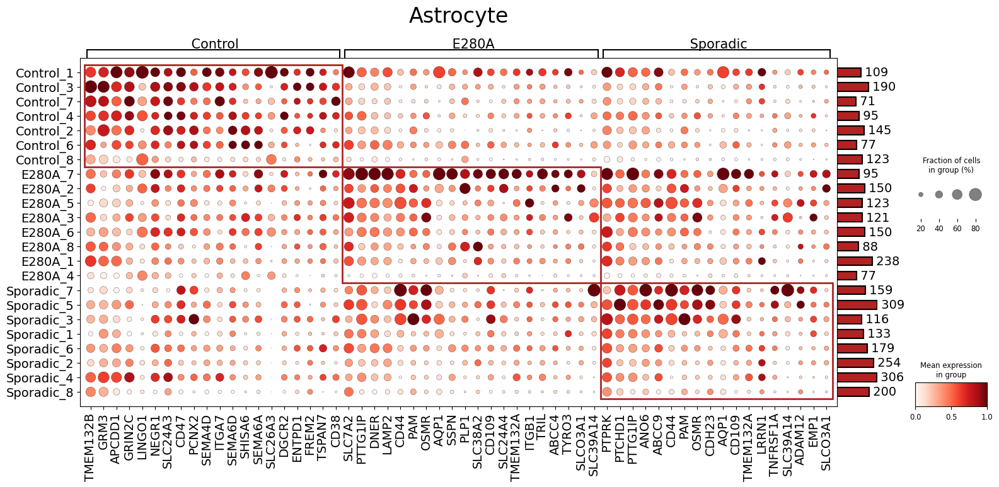

In [55]:
title = target_cell

mkr_dict_updated = plot_marker_exp(adata_t, markers = mkr_dict, celltype_selection = target_cell,
                N_cells_per_group_min = 40, N_markers_per_group_max = 20, N_markers_total = 140,
                title = title, title_y_pos = 2, title_fs = 24, text_fs = 14,
                var_group_height = 1.2, var_group_rotation = 0,
                standard_scale = 'var', nz_frac_max = 0.8, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = None, swap_ax = False, add_rect = True,
                cmap = 'Reds', linewidth = 2, linecolor = 'firebrick' )

In [ ]:
## Works Only when Tumor cell identification was done.
subset_markers_dict = add_to_subset_markers( 
                            adata_t, 
                            tumor_cell_mkr_dict,
                            obs_col_to_add = 'celltype_subset_rev')

plot_marker_exp(adata_t, markers = subset_markers_dict, celltype_selection = None,
                var_group_col = 'celltype_subset_rev', cell_group_col = 'celltype_subset_rev',
                N_cells_per_group_min = 40, N_markers_per_group_max = 10, N_markers_total = 200,
                title = None, title_y_pos = 2, title_fs = 24, text_fs = 14,
                var_group_height = 1.2, var_group_rotation = 45,
                standard_scale = 'var', nz_frac_max = 0.8, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = None, swap_ax = False, add_rect = True,
                cmap = 'Oranges', linewidth = 2, linecolor = 'firebrick' )

#### __D.4 Examining expression patterns of selected markers using violin plots__

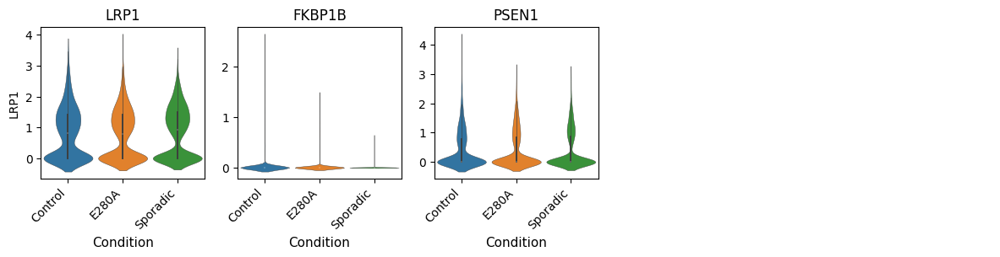

In [57]:
items_to_plot = ['LRP1', 'FKBP1B', 'PSEN1']

b = adata_t.obs['celltype_minor'] == 'Astrocyte'
adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width',
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott',
             figsize = (2.5,2), dpi = 100,
             text_fs = 10, title = None, title_fs = 14, title_y_pos = 1,
             label_fs = 11, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
             ncols = 5, wspace = 0.2, hspace = 0.3, cmap = 'tab10' )

#### __D.5 Statistical test for mean-expression of condition-specific markers__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [58]:
target_genes = []

df_all = get_gene_expression_mean( adata_s, genes = target_genes, group_col = 'sample', nz_pct = True )
df_res = test_group_diff( df_all, ref_group = None, pval_cutoff = 0.001 )

display(df_res)

,E280A_vs_Control,Sporadic_vs_Control,Sporadic_vs_E280A
AL356488.3,0.000972,0.000298,0.311791
SCN2B,0.003207,0.000017,0.135082
RFPL1S,0.013034,0.000103,0.014246
AC067852.2,0.000016,0.030856,0.053140
LINC00943,0.003614,0.000558,0.019274
...,...,...,...
INA,0.857294,0.000509,0.075761
TMA7,0.898448,0.000723,0.055217
PAPLN,0.000999,0.381262,0.111440
AC007405.3,0.316378,0.392192,0.000571


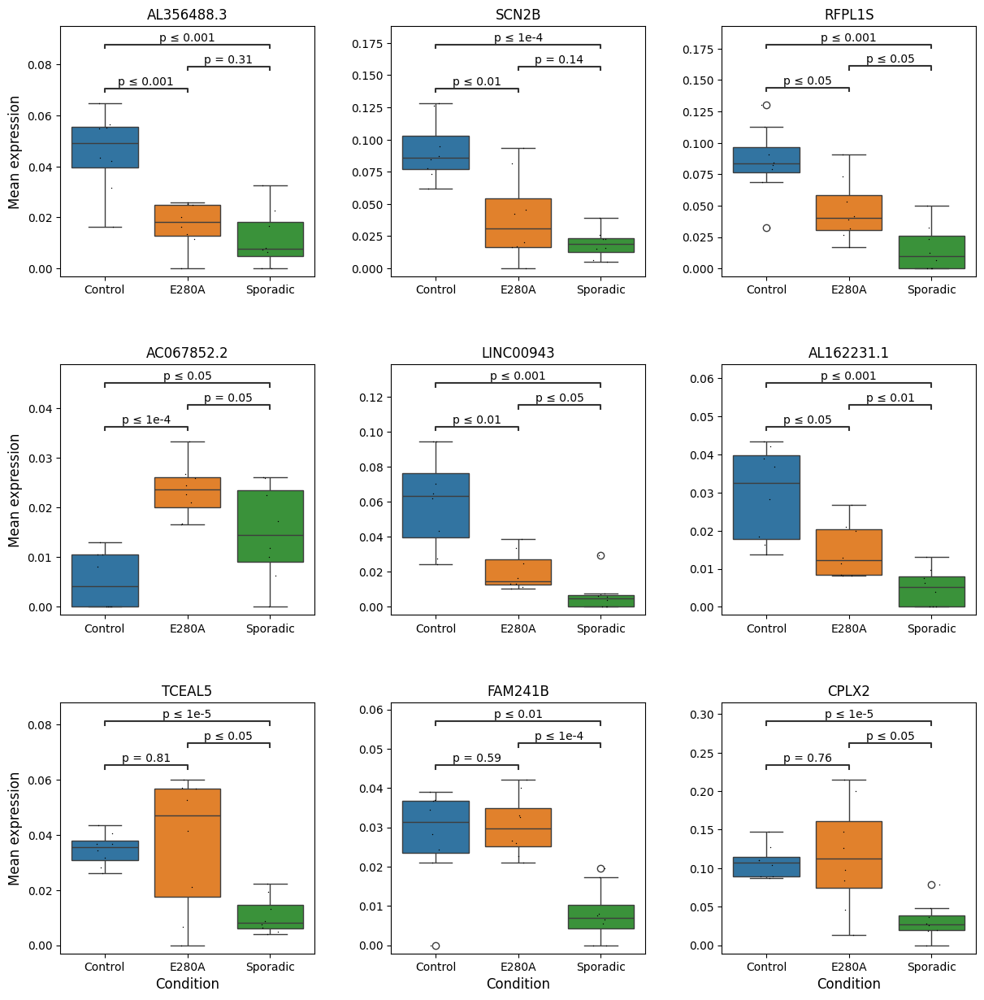

In [59]:
## Show the first 9 genes
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

plot_pct_box( df_all[items_to_plot], df_all['Group'],
              ylabel = 'Mean expression', ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True, stripplot_ms = 5)

#### __D.6 Statistical test for mean-expression of some selected genes__


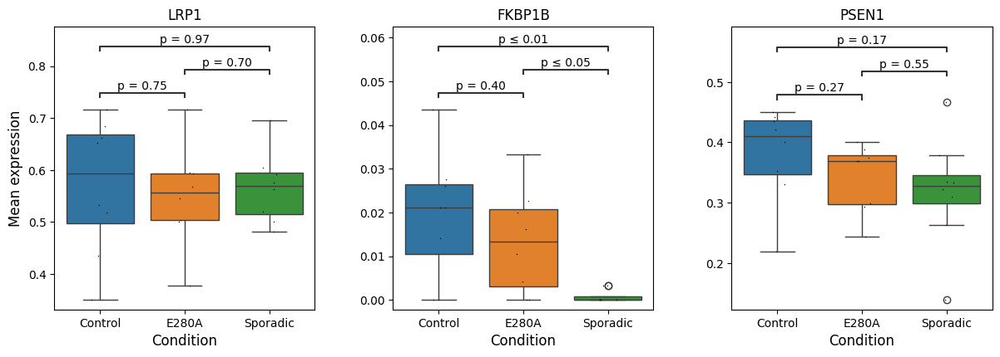

In [60]:
items_to_plot = ['LRP1', 'FKBP1B', 'PSEN1']

plot_pct_box( df_all[items_to_plot], df_all['Group'],
              ylabel = 'Mean expression', ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True, stripplot_ms = 5)

### __E. Gene Set Aanalysis results__
- __GSEApy:__ https://github.com/zqfang/GSEApy

#### __E.1 Structure and format of the GSA/GSEA results__

In [61]:
gsa_res_up = adata_t.uns['GSA_vs_ref_up']
gsa_res_dn = adata_t.uns['GSA_vs_ref_down']

list(gsa_res_up.keys())

['Astrocyte',
 'Endothelial cell',
 'Microglia',
 'Neuron',
 'Oligodendrocyte',
 'Oligodendrocyte progenitor cell']

##### __Structure of the GSA/GSEA results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

- The GSA/GSEA results are processed and stored separately for each cell type.
- The results were based on the corresponding DEG results.

In [62]:
gsa_res = gsa_res_up
target_cell = 'Astrocyte'

gsa_keys = list(gsa_res[target_cell].keys())
list(gsa_keys)

['Control_vs_others', 'E280A_vs_Control', 'Sporadic_vs_Control']

##### __Format of a GSA result__

In [63]:
gsa_res[target_cell][gsa_keys[2]].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
ABC transporters,0.008895,1.00000,ABCD4;ABCB8;ABCB9;ABCA3;ABCC9;TAP1;ABCC4;ABCC1,8,45,2.050875,0.000000,ABC transporters,1
AGE-RAGE signaling pathway in diabetic complications,0.000002,0.05451,AKT3;MAPK10;ICAM1;PRKCE;PLCD3;COL4A2;TGFB2;BCL...,21,100,5.675646,1.263522,AGE-RAGE signaling pathway in diabetic complic...,1
Acute myeloid leukemia,0.032634,1.00000,ZBTB16;SOS1;AKT3;RUNX1T1;TCF7L1;STAT3;IKBKB;ST...,9,67,1.486333,0.000000,Acute myeloid leukemia,1
Adherens junction,0.000208,1.00000,IGF1R;ACTN1;EGFR;PARD3;ACTN4;TCF7L1;WASF2;NECT...,14,71,3.682350,0.000000,Adherens junction,1
Adipocytokine signaling pathway,0.015409,1.00000,IRS1;AKT3;MAPK10;RXRA;ACSBG1;STAT3;IKBKB;IRS2;...,10,69,1.812234,0.000000,Adipocytokine signaling pathway,1


#### __E.2 Barplot visualization of condition-specific pathways activity__

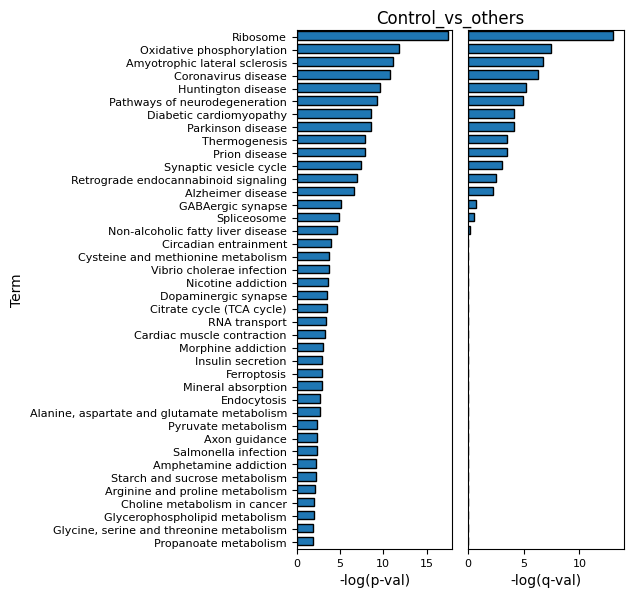

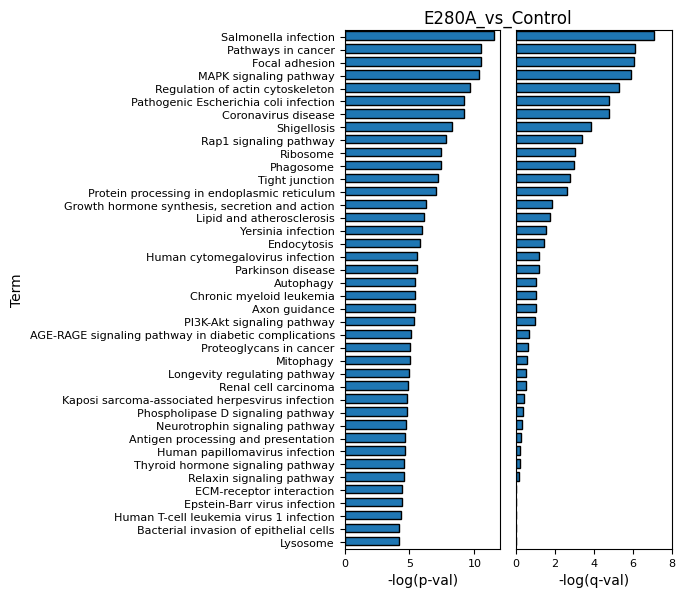

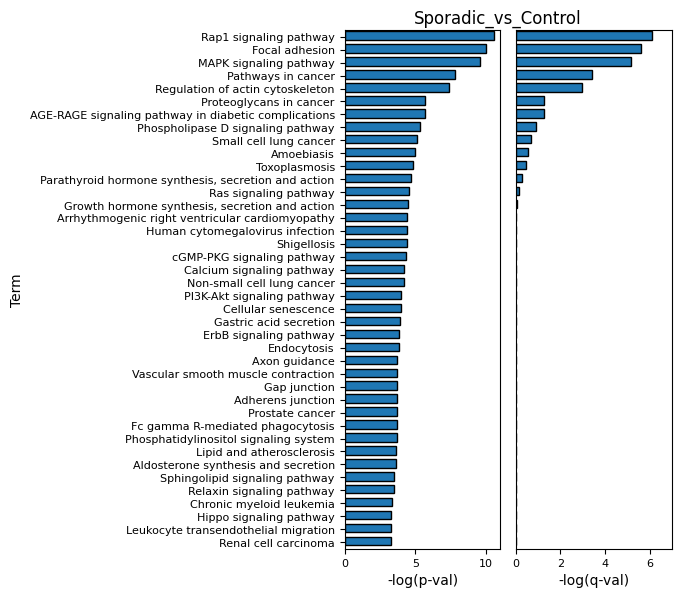

In [64]:
target_cell = 'Astrocyte'

df_gsa_dct = gsa_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsa_dct, pval_cutoff = 0.05, N_max_to_show = 40,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'tab:blue', edgecolor = 'black' )

#### __E.3 Dotplot visualization for an overview of condition-specific pathways activity__

In [65]:
gsa_res = adata_t.uns['GSA_vs_ref_up']
gsa_res.keys()

dict_keys(['Astrocyte', 'Endothelial cell', 'Microglia', 'Neuron', 'Oligodendrocyte', 'Oligodendrocyte progenitor cell'])

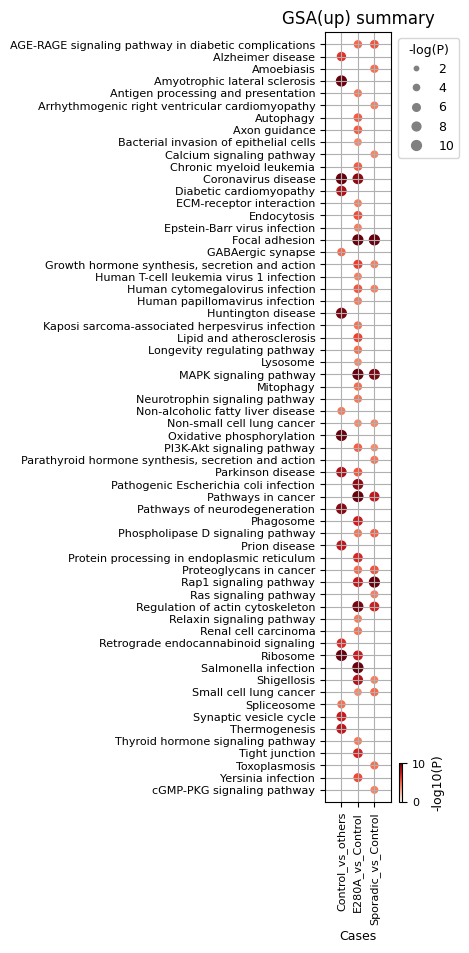

In [67]:
key = 'Astrocyte'
gsa_res_t = gsa_res[key]

plot_gsa_dot( gsa_res_t, pval_cutoff = 1e-4, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1,10),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10, cmap = 'Reds' )

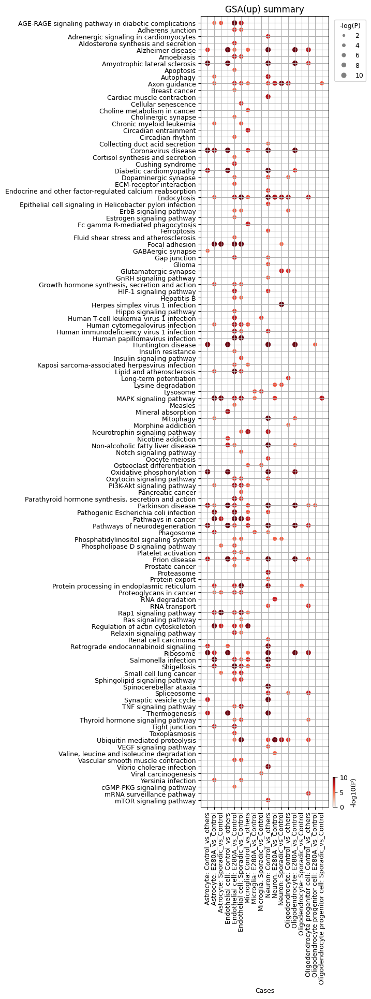

In [68]:
plot_gsa_dot( gsa_res, pval_cutoff = 1e-5, title = 'GSA(up) summary',
              title_fs = 12, tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 40, cbar_frac = 0.05, cbar_aspect = 15,
              cmap = 'Reds' )

### __F. GSEA results__
#### Data structure and format are the same as those for GSA results

In [69]:
gsea_res = adata_t.uns['GSEA_vs_ref']
list(gsea_res.keys())

['Astrocyte',
 'Endothelial cell',
 'Microglia',
 'Neuron',
 'Oligodendrocyte',
 'Oligodendrocyte progenitor cell']

In [70]:
target_cell = 'Astrocyte'

gsea_keys = list(gsea_res[target_cell].keys())
list(gsea_keys)

['Control_vs_others', 'E280A_vs_Control', 'Sporadic_vs_Control']

#### __F.1 Barplot visualization of condition-specific pathways activity__

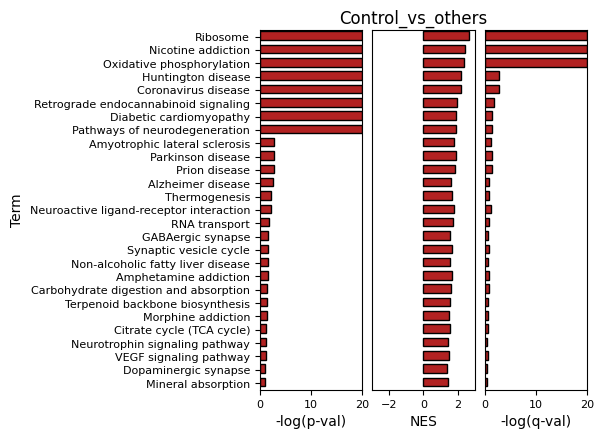

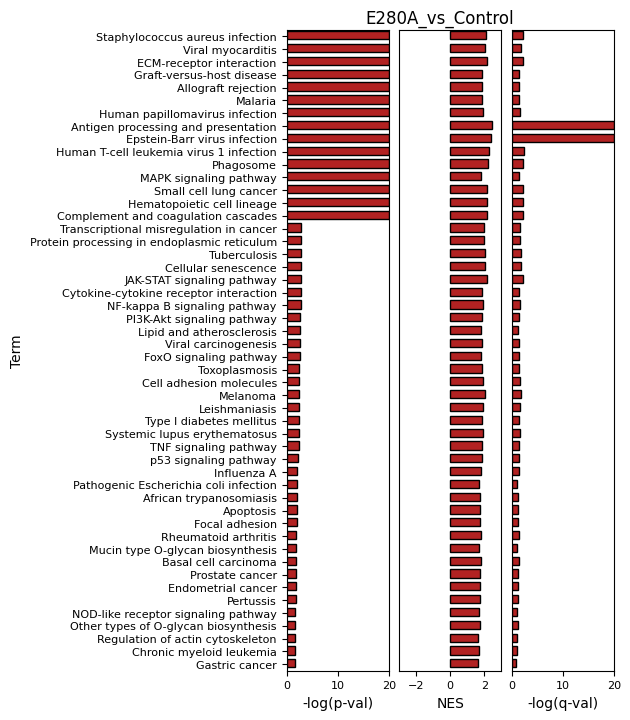

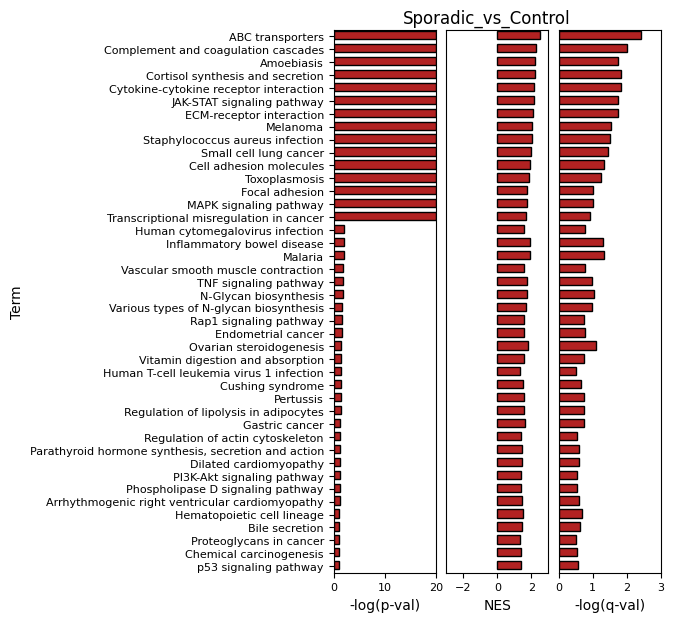

In [71]:
target_cell = 'Astrocyte'
# target_cell = 'Aneuploid Epithelial cell'
df_gsea_dct = gsea_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsea_dct, pval_cutoff = 1e-1,
                           nes_cutoff = 0, N_max_to_show = 50,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'firebrick', edgecolor = 'black' )

#### __F.2 Dotplot visualization for an overview of condition-specific pathways activity__

In [72]:
gsea_res.keys()

dict_keys(['Astrocyte', 'Endothelial cell', 'Microglia', 'Neuron', 'Oligodendrocyte', 'Oligodendrocyte progenitor cell'])

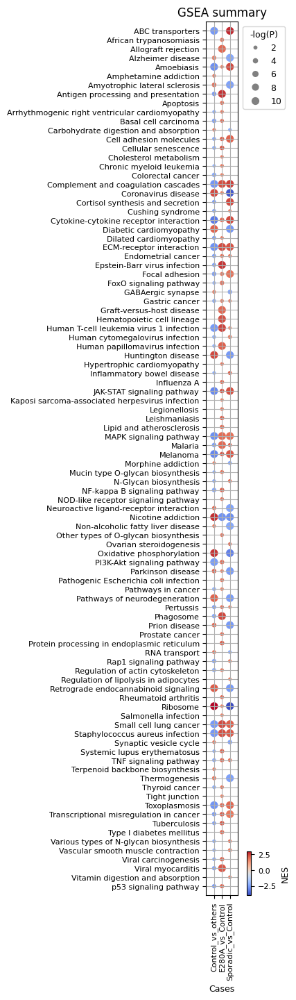

In [73]:
# target_cell = 'Aneuploid Epithelial cell'
target_cell = 'Astrocyte'

gsea_res_t = gsea_res[target_cell]
pval_cutoff = 0.05

plot_gsa_dot( gsea_res_t, pval_cutoff = pval_cutoff,
              title = 'GSEA summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10,
              cmap = 'coolwarm' )

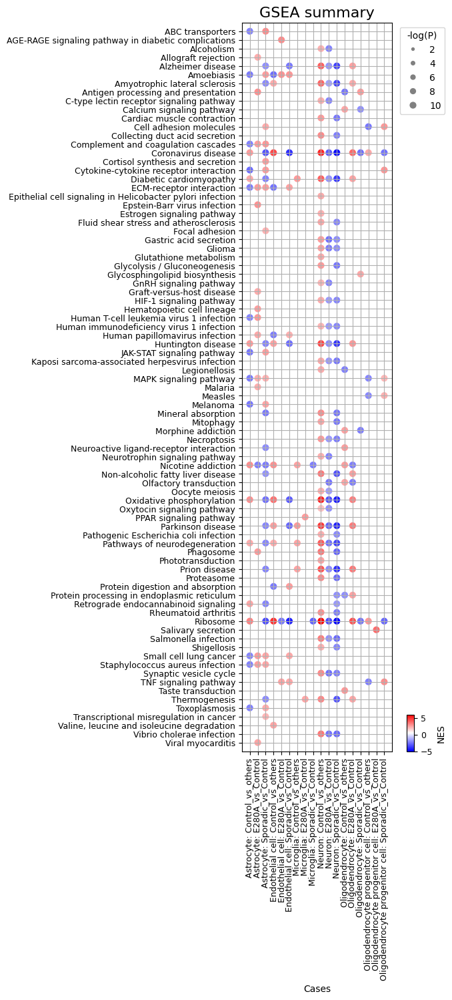

In [74]:
plot_gsa_dot( gsea_res, pval_cutoff = 1e-4,
              title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False,
              figsize = None, dpi = 100, dot_size = 40,
              cbar_frac = 0.2, cbar_aspect = 5, cmap = 'bwr' )